# Imports

In [5]:
#-- Necessary Imports
import numpy as np
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader,Subset
from sklearn.preprocessing import StandardScaler,MinMaxScaler
import glob
import datetime as dt
from tqdm import tqdm
from os.path import exists
import os
import subprocess

import matplotlib.pyplot as plt
import matplotlib as mpl

%matplotlib inline
font = {'size'   : 10}
mpl.rc('font', **font)

from matplotlib.cm import get_cmap
name = "Dark2"
cmap = get_cmap(name)  # type: matplotlib.colors.ListedColormap
colors = cmap.colors


# Data
Download from here: https://zenodo.org/record/4906336#.Y1EWhi8RqDU

In this part of the notebook, we check the data (plot it, etc.) before starting the learning experiments.

In [13]:
# we suppose that you have wget installed (linux/mac) and unzip; otherwise, please download the data using your browser
if not os.path.exists('AndyData-lab-prescientTeleopICub'):
   subprocess.run("wget https://zenodo.org/record/5913573/files/AndyData-lab-prescientTeleopICub.zip?download=1  -O andy.zip", shell=True)
   subprocess.run("unzip andy.zip", shell=True)

data_path = 'AndyData-lab-prescientTeleopICub/datasetMultipleTasks'


--2022-12-14 18:15:12--  https://zenodo.org/record/5913573/files/AndyData-lab-prescientTeleopICub.zip?download=1
Resolving zenodo.org (zenodo.org)... 188.185.124.72
Connecting to zenodo.org (zenodo.org)|188.185.124.72|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 90859410 (87M) [application/octet-stream]
Saving to: ‘andy.zip’

     0K .......... .......... .......... .......... ..........  0% 1,52M 57s
    50K .......... .......... .......... .......... ..........  0% 1,69M 54s
   100K .......... .......... .......... .......... ..........  0% 51,9M 37s
   150K .......... .......... .......... .......... ..........  0% 1,62M 41s
   200K .......... .......... .......... .......... ..........  0% 1,65M 43s
   250K .......... .......... .......... .......... ..........  0% 60,4M 36s
   300K .......... .......... .......... .......... ..........  0% 1,68M 38s
   350K .......... .......... .......... .......... ..........  0% 1,65M 40s
   400K .......... ........

Archive:  andy.zip
   creating: AndyData-lab-prescientTeleopICub/
   creating: AndyData-lab-prescientTeleopICub/datasetGoals/
  inflating: AndyData-lab-prescientTeleopICub/datasetGoals/p1.csv  
  inflating: AndyData-lab-prescientTeleopICub/datasetGoals/c1.csv  
  inflating: AndyData-lab-prescientTeleopICub/datasetGoals/1.csv  
  inflating: AndyData-lab-prescientTeleopICub/datasetGoals/p2.csv  
  inflating: AndyData-lab-prescientTeleopICub/datasetGoals/c2.csv  
  inflating: AndyData-lab-prescientTeleopICub/datasetGoals/2.csv  
  inflating: AndyData-lab-prescientTeleopICub/datasetGoals/p3.csv  
  inflating: AndyData-lab-prescientTeleopICub/datasetGoals/c3.csv  
  inflating: AndyData-lab-prescientTeleopICub/datasetGoals/3.csv  
  inflating: AndyData-lab-prescientTeleopICub/datasetGoals/p4.csv  
  inflating: AndyData-lab-prescientTeleopICub/datasetGoals/c4.csv  
  inflating: AndyData-lab-prescientTeleopICub/datasetGoals/4.csv  
  inflating: AndyData-lab-prescientTeleopICub/datasetGoals/p5.

In [288]:
# load the data
import glob


# we make a dataset so that we can use mini-batches, etc.
# this is only for LSTM and MLP (not for ProMP)
class TrajectoryData(Dataset): # testing will use the same scaler as training
  def __init__(self, glob_dir, skip_data, column, input_length, output_length, range, scaler = None):
    self.column = column
    self.skip_data = skip_data
    self.input_length = input_length
    self.output_length = output_length
    self.episodes = self._load_files(glob_dir, skip_data, column, range)
    self.episodes_scaled, self.scaler = self._scale_episodes(self.episodes, scaler)
    self.x, self.y = self._make_dataset(self.episodes_scaled, input_length, output_length)
    self.len = self.x.shape[0]
    print("Dataset loaded, length:", self.x.shape[0])

  def __getitem__(self,index):               
    return self.x[index],self.y[index]
  
  def __len__(self):
    return self.len

  def _make_dataset(self, episodes, input_length, output_length):
    x = torch.FloatTensor([])
    y = torch.FloatTensor([])
    for ep in episodes:
      x_ep, y_ep = self._make_x_y_pairs(ep,  input_length, output_length)
      x = torch.cat([x, x_ep], dim=0)
      y = torch.cat([y, y_ep], dim=0)
    return x, y

  # This could use padding to get recognition from the first time-steps
  def _make_x_y_pairs(self, episode, input_length, output_length):
    x = [episode[i:i+input_length] for i in range(len(episode)-input_length-output_length)]
    y = [episode[i+input_length:i+input_length+output_length] for i in range(len(episode)-input_length-output_length)]   
    #-- use the stack function to convert the list of 1D tensors
    # into a 2D tensor where each element of the list is now a row
    x = torch.stack(x)
    y = torch.stack(y)
    return x, y


  # scale all the episodes (same scaling for all the data)
  def _scale_episodes(self, episodes, other_scaler):
    # first, get all the data in a single tensor
    train_all = np.array([])
    for l in episodes:
      train_all = np.concatenate((train_all, l)) # useful for normalization
   
    # scale according to all the data
    if other_scaler == None:
      scaler = StandardScaler()
      scaler.fit(train_all.reshape(-1,1))
    else:
      scaler = other_scaler

    #scale each episode
    episodes_scaled = []
    for l in episodes:
        scaled = scaler.transform(l.reshape(-1,1))
        episodes_scaled += [torch.FloatTensor(scaled).view(-1)]
    return episodes_scaled, scaler
  
  # load a set of trajectory, keeping them separate
  def _load_files(self, glob_dir, skip_data, column, range):
    files = glob.glob(glob_dir)
    files = files[int(range[0] * len(files)):int(range[1] * len(files)) - 1]
    episodes = []
    if len(files) == 0:
      print("ERROR: no files for this dataset!", glob_dir)
      raise FileExistsError(glob_dir)
    for f in files:
      if not os.path.exists(f):
        print("ERROR, file does not exist:", f)
        raise FileExistsError(f)
      l =  np.loadtxt(f, delimiter=',')
      episodes += [l[::skip_data, column]]
    return episodes



# parameters
column = 2 # column in the data
skip_data = 10 # subsampling -> 100 Hz to 10Hz

train_periods = 10 # number of timesteps as input
prediction_periods = 10 # number of predicted timesteps

data_training = TrajectoryData(f'{data_path}/*/p*.csv', skip_data, column, train_periods, prediction_periods, [0, 0.5])
data_testing = TrajectoryData(f'{data_path}/*/p*.csv', skip_data, column, train_periods, prediction_periods, [0.5, 1.0], scaler=data_training.scaler)



Dataset loaded, length: 6345
Dataset loaded, length: 6838


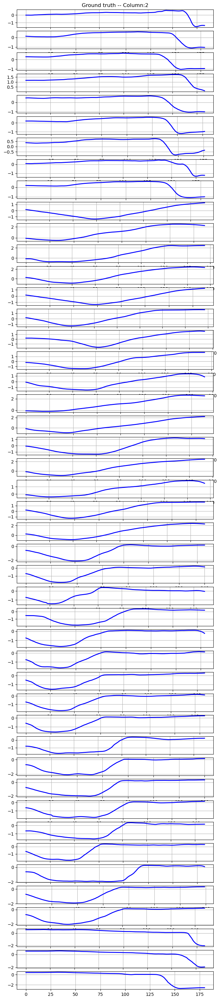

In [289]:
# plot the ground truth data (scaled) for each trajectory
fig = plt.figure(figsize=(8,40))
for i in range(0, len(data_training.episodes_scaled)):
    ax = fig.add_subplot(len(data_training.episodes_scaled), 1, i+1)
    if (i == 0):
        ax.set_title(f'Ground truth -- Column:{column}')

    ax.grid(True)
    ground_truth = data_training.episodes_scaled[i]
    x = np.arange(len(ground_truth))
    ax.plot(x, ground_truth, "b-",linewidth=2)

plt.savefig('ground_truth-scaled', dpi=600)

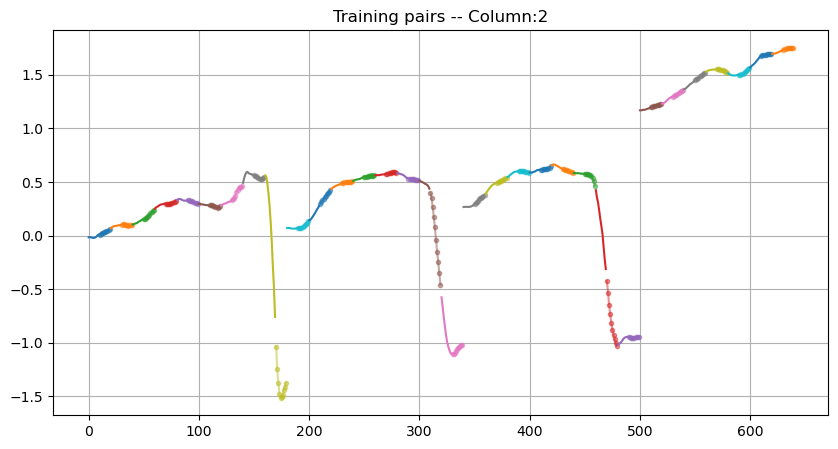

In [290]:
# plot the xy pairs
fig = plt.figure(figsize=(10,5))
ax = fig.add_subplot(1, 1, 1)
ax.set_title(f'Training pairs -- Column:{column}')
ax.grid(True)

x = np.arange(len(data_training.x))
i = 0
for i in range(0, int(len(data_training.x) / 10), data_training.input_length + data_training.output_length):
    color = next(ax._get_lines.prop_cycler)['color']
    ax.plot(x[i:i +  data_training.input_length], data_training.x[i], color=color)
    ax.plot(x[i +  data_training.input_length:i +  data_training.input_length + data_training.output_length], data_training.y[i], marker='.', alpha=0.5, color=color)

plt.savefig('plot0', dpi=600)

# LSTM

In [291]:
# define the LSTM neural network
class LSTM(nn.Module):
    """
    input_size - will be 1 in this example since we have only 1 predictor (a sequence of previous values)
    hidden_size - Can be chosen to dictate how much hidden "long term memory" the network will have
    output_size - This will be equal to the prediciton_periods input to get_x_y_pairs
    """
    def __init__(self, input_size, hidden_size, output_size):
        super(LSTM, self).__init__()
        self.hidden_size = hidden_size
        self.input_size = input_size
        self.output_size = output_size
        self.num_layers = 1

        # input -> output
        # batch_first=False : (seq_len, batch_size, features) -> (seq_len, batch_size, hidden_size).
        # batch_first=True: (batch_size, seq_len, features) -> (batch_size, seq_len, hidden_size).
        # unbatched: (seq_length, input_size) -> (seq_len, hidden_size)
        self.lstm = nn.LSTM(input_size=input_size, 
                            hidden_size=hidden_size,
                            num_layers=self.num_layers, 
                            batch_first=True,
                            dropout=0)
        
        # we use the sequence of all the hidden state to predict the output
        # linear expect [batch_size, *, nb_features]
        self.linear = nn.Linear(hidden_size * output_size, output_size)
        
    def forward(self, x, hidden=None):
        batch_size = x.shape[0]
        seq_length = x.shape[1]
        if hidden==None:
            self.hidden = (torch.zeros(self.num_layers, batch_size, self.hidden_size),
                           torch.zeros(self.num_layers, batch_size, self.hidden_size))
        else:
            self.hidden = hidden
            
        """
        inputs need to be in the right shape as defined in documentation
        - https://pytorch.org/docs/stable/generated/torch.nn.LSTM.html
        
        lstm_out - will contain the hidden states from all times in the sequence
        self.hidden - will contain the current hidden state and cell state
        """
        shape = (batch_size, seq_length, 1)# we don't have the 1 in the dataset for now
        lstm_out, self.hidden = self.lstm(x.view(shape), self.hidden)
        # the linear predictor can use the list of all the hidden states if it wants (and not only the end)
        # this might be useful because we want to predict all the n next steps
        # we can't use view here because the stride does not match?
        out = lstm_out.reshape(batch_size, -1)
        predictions = self.linear(out)  #self.linear(lstm_out.view(len(x), -1))
        
        return predictions, self.hidden

## Training

In [292]:
# training (this takes time!)
# instantiate the LSTM model
lstm_model = LSTM(input_size=1, hidden_size=10, output_size=prediction_periods)
print(lstm_model)
criterion = nn.MSELoss()
optimizer = optim.Adam(lstm_model.parameters(), lr=0.001)

epochs = 50
lstm_model.train()
loss_list = []

train_loader = DataLoader(dataset=data_training, batch_size=16, shuffle=True)
for epoch in tqdm(range(epochs+1)):
    for x,y in train_loader:#zip(x_train, y_train):
        y_hat, _ = lstm_model(x)
        loss = criterion(y_hat, y)
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()
        loss_list += [loss.item()]   

print("Last training loss:", loss_list[-1])

LSTM(
  (lstm): LSTM(1, 10, batch_first=True)
  (linear): Linear(in_features=100, out_features=10, bias=True)
)


 41%|████      | 21/51 [00:35<00:50,  1.69s/it]


KeyboardInterrupt: 

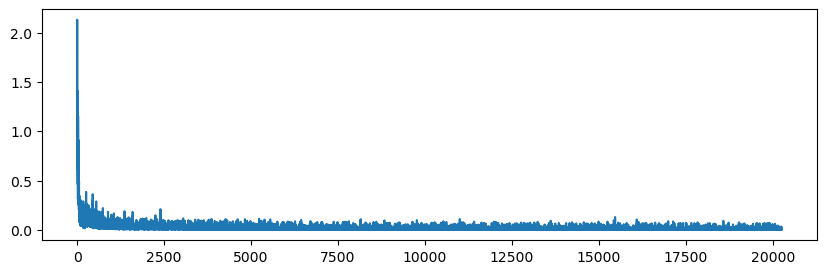

In [ ]:
# plot the loss
fig = plt.figure(figsize=(10,3))
ax = fig.add_subplot(1,1,1)
ax.plot(loss_list)

## Results

In [ ]:
# compute the loss
def eval_loss(model, dataset):
    mse = nn.MSELoss()
    model.eval()
    loss = 0
    for i in tqdm(range(0, len(dataset))):
        with torch.no_grad():
            x,y = dataset[i]
            y_hat,_ = model(x.view(1, -1))
            loss += mse(y_hat, y.view(1, -1)).item()
    return loss / len(dataset)

train_loss = eval_loss(lstm_model, data_training)
test_loss =  eval_loss(lstm_model, data_testing)

print("Train loss:", train_loss)
print("Test loss (expect some overfitting!):", test_loss)


100%|██████████| 6838/6838 [00:02<00:00, 3306.21it/s]

Train loss: 0.008600615738643706
Test loss (expect some overfitting!): 1362.5709033474895


In [ ]:
#evaluation / we always use the same scaler as the scaling of new trajectory is unknown
# we eval for all the timesteps

def eval_model(model, dataset):
    model.eval()
    preds = []
    x_preds = []
        
    # for all episodes (replications of the task)
    for i in tqdm(range(0, len(dataset.episodes))):
        e_preds = []
        e_x_preds = []
        scaled = dataset.episodes_scaled[i]
        # query for all the points
        for x in range(0, len(scaled) - train_periods - 1):
            with torch.no_grad():
                predictions, _ = model(scaled[x:x+train_periods].view(1, -1))
            #-- Apply inverse transform to undo scaling
            predictions = dataset.scaler.inverse_transform(np.array(predictions.reshape(-1,1)))
            e_preds += [predictions]
            e_x_preds += [x + train_periods]
        preds += [e_preds]
        x_preds += [e_x_preds]
    return x_preds, preds

# this is for both training & testing
x_preds, preds = eval_model(lstm_model, data_testing)


100%|██████████| 47/47 [00:02<00:00, 16.10it/s]


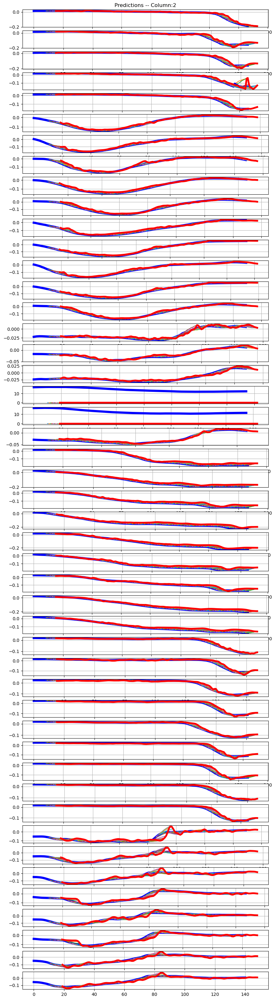

In [ ]:
# plot the predictions
def plot_predictions(data, x_preds, preds):
    fig = plt.figure(figsize=(10,40))
    for i in range(0, len(data.episodes)):
        ax = fig.add_subplot(len(data.episodes), 1, i+1)
        if (i == 0):
            ax.set_title(f'Predictions -- Column:{column}')

        ax.grid(True)
        ground_truth = data.episodes[i]
        x = np.arange(len(ground_truth))
        ax.plot(x, ground_truth, "b-",linewidth=5)

        p1s = []
        x1s = []
        for j in range(0, len(x_preds[i])):
            x_p = np.arange(x_preds[i][j], x_preds[i][j] + train_periods)
            ax.plot(x_p, preds[i][j], "-",alpha=1)
            p1s += [preds[i][j][-1]]
            x1s += [x_p[-1]]
        ax.plot(x1s, p1s, '-', lw=4, color='red')

    plt.savefig('plot1', dpi=600)

plot_predictions(data_testing, x_preds, preds)

# ProMP
- p*.csv data contain the corresponding body segments positions (waist z, right hand x, right hand y, right hand z, left hand x, left hand y, left hand z) retargeted on the robot iCub.
=> column 2 = right hand y

We call the C++ code `promp.cpp`(we could have used the python interface, but it did not work well on OS-X + Conda)

Please note that we do something *very slow*: 
- at each time-step, we call the C++ code to perform the conditioning + time-scaling, which means parsing all the trajectory, computing everything (learning), etc.
- the C++ code generates a full trajectory as a csv
- we parse the .csv to get the point(s) that interests us

This could be much faster.

In [2]:
# we first need to compile the c++ code
# we are assuming that the libpromp has been installed: https://github.com/hucebot/promp
!g++  -O3 -march=native -std=c++14 -I /usr/local/include/eigen3 promp/promp.cpp  -l promp -o promp/promp


In file included from promp/promp.cpp:1:
In file included from /usr/local/include/promp/io/serializer.hpp:23:
In file included from /usr/local/include/promp/promp.hpp:25:
In file included from /usr/local/include/promp/trajectory_group.hpp:26:
/usr/local/include/promp/io/csv_reader.hpp:25:16: warning: nested namespace definition is a C++17 extension; define each namespace separately [-Wc++17-extensions]
namespace promp::io {
               ^~~~
                { namespace io
In file included from promp/promp.cpp:1:
/usr/local/include/promp/io/serializer.hpp:26:16: warning: nested namespace definition is a C++17 extension; define each namespace separately [-Wc++17-extensions]
namespace promp::io {
               ^~~~
                { namespace io
2 warnings generated.


Loading data...ok
Learning promp...ok
Infering speed of test traj...->1.00013Condititioning...# POINTS:499
ok


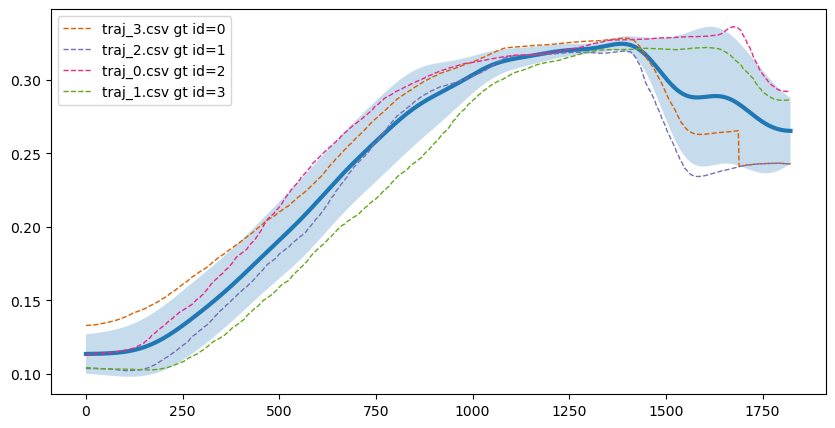

In [ ]:
import subprocess

# learn a PROMP
fig = plt.figure(figsize=(10,5))
ax.set_title('rhandx', x=0.15, y=1.0, pad=-14, fontweight="bold")
ax = fig.add_subplot(1, 1, 1)

task = 'PlaceBoxTable'
dof = 1

subprocess.run("rm traj_*.csv", shell=True)

g = glob.glob(f'{data_path}/{task}/p*.csv') # wer will only keep the first half for training
training_trajs = ' '.join(g[0:int(0.5 * len(g)) + 1]) # convert to a list of string for command line

subprocess.run(f"promp/promp 500 {dof} {data_path}/{task}/p7.csv {training_trajs}", shell=True, check=True)

generated = np.loadtxt('generated.csv', delimiter=',')
variance = np.loadtxt('variance.csv', delimiter=',')
ax.fill_between(np.arange(generated.shape[0]), generated + variance, generated - variance, alpha=0.25 )
ax.plot(generated, lw=3)

# normalized trajs
g = glob.glob("traj_*.csv")
for i in range(len(g)):
    d = np.loadtxt(g[i], delimiter=' ', skiprows=3)
    ax.plot(d, '--', color=colors[i+1 % len(colors)], label=g[i] + ' gt id=' + str(i), lw='1')
_ = ax.legend()

In [ ]:
import collections

# now the conditioning
tasks = [x.split('/')[-1] for x in glob.glob(f"{data_path}/*")]

dof = 1

data_promp = collections.defaultdict(list)
data_promp_mean = collections.defaultdict(list)
data_promp_var = collections.defaultdict(list)
ground_truth = collections.defaultdict(list)
for t in tasks:
    print("TASK", t)
    for g in glob.glob(f"{data_path}/{task}/p*.csv"):
        print(g, end=' | ')
        f = np.loadtxt(g, delimiter=',')
        subprocess.run(f"promp/promp {0.5 * f.shape[0]} {dof} {g} {data_path}/{t}/p*.csv" , stdout=subprocess.DEVNULL, shell=True, check=True)
        data_promp[t].append(np.loadtxt('conditioned.csv', delimiter=','))
        #data_promp_mean[t].append(np.loadtxt('modulated.csv', delimiter=','))
        #data_promp_var[t].append(np.loadtxt('variance.csv', delimiter=','))
        ground_truth[t].append(np.loadtxt(g, delimiter=','))
    print(t, "=>", len(data_promp[t]))

TASK PlaceBoxDown
AndyData-lab-prescientTeleopICub/datasetMultipleTasks/PlaceBoxTable/p1.csv | AndyData-lab-prescientTeleopICub/datasetMultipleTasks/PlaceBoxTable/p2.csv | AndyData-lab-prescientTeleopICub/datasetMultipleTasks/PlaceBoxTable/p3.csv | AndyData-lab-prescientTeleopICub/datasetMultipleTasks/PlaceBoxTable/p7.csv | AndyData-lab-prescientTeleopICub/datasetMultipleTasks/PlaceBoxTable/p6.csv | AndyData-lab-prescientTeleopICub/datasetMultipleTasks/PlaceBoxTable/p4.csv | AndyData-lab-prescientTeleopICub/datasetMultipleTasks/PlaceBoxTable/p5.csv | AndyData-lab-prescientTeleopICub/datasetMultipleTasks/PlaceBoxTable/p8.csv | AndyData-lab-prescientTeleopICub/datasetMultipleTasks/PlaceBoxTable/p9.csv | PlaceBoxDown => 9
TASK BottleTable
AndyData-lab-prescientTeleopICub/datasetMultipleTasks/PlaceBoxTable/p1.csv | AndyData-lab-prescientTeleopICub/datasetMultipleTasks/PlaceBoxTable/p2.csv | AndyData-lab-prescientTeleopICub/datasetMultipleTasks/PlaceBoxTable/p3.csv | AndyData-lab-prescientT

100%|██████████| 9/9 [00:01<00:00,  5.65it/s]


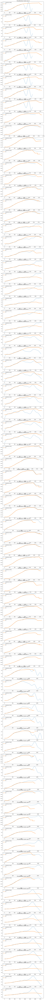

In [ ]:
#total number of plots
n = sum([len(data_promp[k]) for k in data_promp.keys()])
fig = plt.figure(figsize=(10,3 * n))

dofs = ['waistz', 'rhandx', 'rhandy', 'rhandz', 'lhandx', 'lhandy', 'lhandz']
dof = 1
k = 1
for task in tqdm(data_promp.keys()): # for each task
    for i in range(len(data_promp[task])): # for each replicate
        ax = fig.add_subplot(n, 1, k)
        #ax.fill_between(np.arange(data_promp_mean[task][i][:].shape[0]), data_promp_mean[task][i][:] - data_promp_var[task][i][:], data_promp_var[task][i][:] + data_promp_mean[task][i][:], alpha=0.1, color="black" )
        #ax.plot(data_promp_mean[task][i][:], '-', lw=2, label='mean (no cond.)', alpha=0.5)

        ax.plot(data_promp[task][i][:], '--', label='prediction (50%)')
        ax.plot(ground_truth[task][i][:,dof], '-', lw=2, label='gt')

        ax.set_title(task + ' ' + dofs[dof] + " rep=" + str(i))
        ax.legend()
        k += 1

## Predict the next second (horizon)

In [ ]:
!cd promp && g++  -O3 ./promp.cpp  -std=c++17 -I /usr/local/include/eigen3 -lpromp -o promp

In [ ]:
def promp_prediction(horizon:int, dof:int, training : str, testing : str, skip:int) -> np.array :
    original = np.loadtxt(testing, delimiter=',') # only for length...
    pred = []
    indices = []
    for i in tqdm(range(10, original.shape[0] - horizon, skip)):
        subprocess.run(f"promp/promp {i} {dof} {testing} {training}" , shell=True, check=True, stdout=subprocess.DEVNULL)
        promp = np.loadtxt('conditioned.csv', delimiter=',')
        if i + horizon < promp.shape[0]:
            pred += [promp[i + horizon]]
        else:
            pred += [promp[-1]]
        indices += [i + horizon]
    return np.array([indices, pred]).transpose()


100%|██████████| 78/78 [00:54<00:00,  1.44it/s]


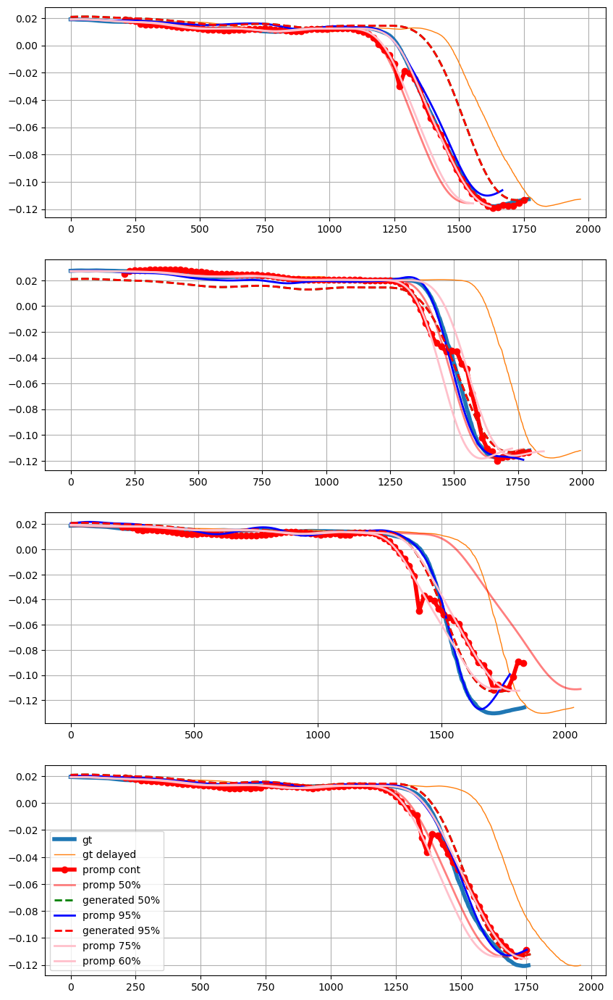

In [ ]:
# plot something to check
task ='PlaceBoxHigh'
dof = 'rhandx'
dof_id = 2
horizon = 200

fig = plt.figure(figsize=(10,4 * len(g)))


g = glob.glob(f'{data_path}/{task}/p*.csv') # we will only keep the first half for training
training_trajs = ' '.join(g[0:int(0.5 * len(g)) + 1]) # convert to a list of string for command line
test_trajs = g[int(0.5 * len(g)) + 1:] 

skip = 20


# for this specific task and dof
# list is the replicates, first col is x, second col prediction
promp_preds = []

for k in range(len(test_trajs)):
    f = test_trajs[k]
    ax = fig.add_subplot(len(g), 1, k + 1)
    original = np.loadtxt(f, delimiter=',')
    ax.plot(original[:, dof_id], lw=4, label='gt')
    ax.plot(np.arange(original.shape[0]) + horizon, original[:, dof_id], lw=1, label='gt delayed')

    # now predict
    pred = promp_prediction(horizon, dof_id, training_trajs, f, skip)
    promp_preds += [pred]
    ax.plot(pred[:,0], pred[:,1] , 'o-', lw=4, label='promp cont', color='red', alpha=1.0)
    # show ProMPS at different time-steps to check that everything makes sense
    subprocess.run(f"promp/promp {0.5 * original.shape[0]} {dof_id} {f} {training_trajs}" , shell=True, check=True, stdout=subprocess.DEVNULL)
    promp = np.loadtxt('conditioned.csv', delimiter=',')
    ax.plot(promp, lw=2, label='promp 50%', color='red', alpha=0.5)
    mod = np.loadtxt('generated.csv', delimiter=',')
    ax.plot(mod, '--', lw=2, label='generated 50%', color='green', alpha=1.0)


    subprocess.run(f"promp/promp {0.95 * original.shape[0]} {dof_id} {f} {training_trajs}" , shell=True, check=True,  stdout=subprocess.DEVNULL)
    promp = np.loadtxt('conditioned.csv', delimiter=',')
    ax.plot(promp, lw=2, label='promp 95%', color='blue', alpha=1.0)
    # mod = np.loadtxt('modulated.csv', delimiter=',')
    # ax.plot(mod, '--', lw=2, label='modulated 95%', color='blue', alpha=1.0)
    mod = np.loadtxt('generated.csv', delimiter=',')
    ax.plot(mod, '--', lw=2, label='generated 95%', color='red', alpha=1.0)

    subprocess.run(f"promp/promp {0.75 * original.shape[0]} {dof_id} {f} {training_trajs}" , shell=True, check=True, stdout=subprocess.DEVNULL)
    promp = np.loadtxt('conditioned.csv', delimiter=',')
    ax.plot(promp, lw=2, label='promp 75%', color='pink', alpha=1.0)


    subprocess.run(f"promp/promp {0.6 * original.shape[0]} {dof_id} {f} {training_trajs}" , shell=True, check=True, stdout=subprocess.DEVNULL)
    promp = np.loadtxt('conditioned.csv', delimiter=',')
    ax.plot(promp, lw=2, label='promp 60%', color='pink', alpha=1.0)

    # subprocess.run(f"promp/promp {0.5 * original.shape[0]} {dof_id} {f} {p}" , shell=True, check=True, stdout=subprocess.DEVNULL)
    # promp = np.loadtxt('conditioned.csv', delimiter=',')
    # ax.plot(promp, lw=2, label='promp 50%', color='grey', alpha=1.0)

   

    ax.grid()
ax.legend()

# Comparison
## ProMP

In [293]:
horizon = 200 
skip = 200

pred_promp = collections.defaultdict(lambda : collections.defaultdict(list))

task_list = [x.split('/')[-1] for x in glob.glob(f'{data_path}/*')]
print(task_list)
for task in task_list:

    g = glob.glob(f'{data_path}/{task}/p*.csv') # we will only keep the first half for training
    training_trajs = ' '.join(g[0:int(0.5 * len(g))+1]) # convert to a list of string for command line
    testing_trajs = g[int(0.5 * len(g))+1:]
    
    for k in tqdm(range(len(testing_trajs))): # for all testing files
        f = testing_trajs[k]
        original = np.loadtxt(f, delimiter=',')
        for dof_id in range(0, original.shape[1]): # for all dofs
            # prediction
            pred = []
            r = range(horizon, original.shape[0] - horizon, skip) # we skip horizon time-steps (like LSTM)
            for i in r:
                subprocess.run(f"promp/promp {i} {dof_id} {f} {training_trajs}" , shell=True, check=True, stdout=subprocess.DEVNULL)
                promp = np.loadtxt('conditioned.csv', delimiter=',')
                t = min(i + horizon, promp.shape[0] - 1)
                pred += [promp[t]]
            pred_promp[task][dof_id] += [np.array(pred)]

['PlaceBoxDown', 'BottleTable', 'PickBoxMid', 'PickBoxLow', 'PlaceBoxTable', 'BottleBox', 'PlaceBoxSide', 'PlaceBoxHigh', 'PickBoxTable']


100%|██████████| 4/4 [01:40<00:00, 25.15s/it]


In [294]:
# ERRORS
rms_promp = collections.defaultdict(lambda : collections.defaultdict(list))
for task in task_list:
    g = glob.glob(f'{data_path}/{task}/p*.csv') # wer will only keep the first half for training
    training_trajs = ' '.join(g[0:int(0.5 * len(g))+1]) # convert to a list of string for command line
    testing_trajs = g[int(0.5 * len(g))+1:]

    for k in tqdm(range(len(testing_trajs))): # for all testing files
        original = np.loadtxt(testing_trajs[k], delimiter=',')
        for dof_id in range(0, original.shape[1]): # for all dofs
            # compute the errors
            error_pred = 0
            j = 0 
            for i in range(horizon, original.shape[0] - horizon, skip):
                p = pred_promp[task][dof_id][k][j]
                gt = original[i + horizon, dof_id]
                rms_promp[task][dof_id] += [abs(p - gt)]
                j += 1
            #print(error_pred)

100%|██████████| 4/4 [00:00<00:00, 273.52it/s]


(0.0, 0.1)

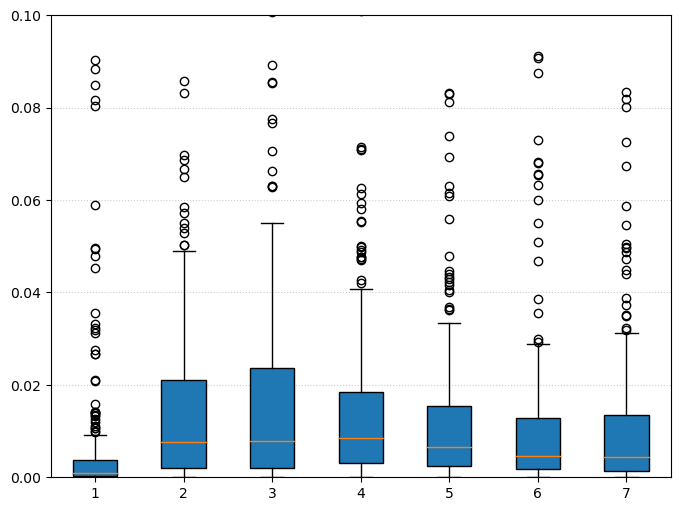

In [295]:
fig = plt.figure(figsize=(8,6))
ax = fig.add_subplot(1,1, 1)


# rms_promp
promp = []
for i in range(len(dofs)):
    promp += [[j for t in rms_promp.keys() for j in rms_promp[t][i]]]
    
ax.grid(color='#cccccc',linestyle='dotted', axis='y')
bp1 = ax.boxplot(promp, patch_artist=True)
ax.set_ylim([0, 0.1])


## Reference (shift)

In [296]:

rms_delayed = collections.defaultdict(lambda : collections.defaultdict(list))
task_list = [x.split('/')[-1] for x in glob.glob(f'{data_path}/*')]
for task in task_list:
    g = glob.glob(f'{data_path}/{task}/p*.csv') # we will only keep the first half for training
    testing_trajs = g[int(0.5 * len(g))+1:]
    for k in tqdm(range(len(testing_trajs))): # for all testing files
        f = testing_trajs[k]
        original = np.loadtxt(f, delimiter=',')
        for dof_id in range(0, original.shape[1]): # for all dofs
            error_pred = 0
            k = 0
            for i in np.arange(original.shape[0]):
                p =  original[min(i, original.shape[0] - 1), dof_id]
                gt = original[min(i + horizon, original.shape[0] - 1), dof_id]
                rms_delayed[task][dof_id] += [abs(p - gt)]
                k += 1

100%|██████████| 4/4 [00:00<00:00, 53.89it/s]


(0.0, 0.1)

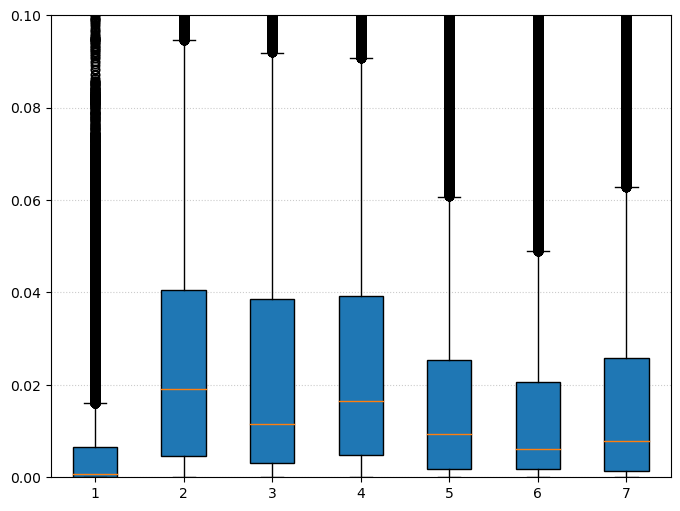

In [297]:
fig = plt.figure(figsize=(8,6))
ax = fig.add_subplot(1,1, 1)

# rms_promp
delayed = []
for i in range(len(dofs)):
    delayed += [[j for t in rms_delayed.keys() for j in rms_delayed[t][i]]]

ax.grid(color='#cccccc',linestyle='dotted', axis='y')
bp1 = ax.boxplot(delayed, patch_artist=True)
ax.set_ylim([0, 0.1])

## LSTM

In [298]:
print("Horizon:", horizon)
skip_data = 10 # subsampling -> 100 Hz to 10Hz
train_periods = int(horizon / skip_data) # number of timesteps as input
prediction_periods = int(horizon / skip_data) # number of predicted timesteps


# some data for neural networks (complex pattern to exclude the BottleBox...)
# in the order of the columns
# first the Cartesian positions
dofs = ['waistz', 'rhandx', 'rhandy', 'rhandz', 'lhandx', 'lhandy', 'lhandz']
train_data = {}

for k in range(len(dofs)):
    train_data[k] = TrajectoryData(f'{data_path}/*/p*.csv', skip_data, k, train_periods, prediction_periods, [0, 0.5])


Horizon: 200
Dataset loaded, length: 5425
Dataset loaded, length: 5425
Dataset loaded, length: 5425
Dataset loaded, length: 5425
Dataset loaded, length: 5425
Dataset loaded, length: 5425
Dataset loaded, length: 5425


In [299]:
# train the LSTM (one LSTM for each DoF)

epochs = 10 # should be 100 for data
replicates = 1 # should be 10 for data
lstm_models = collections.defaultdict(list)
for rep in range(0, replicates):
    for k in tqdm(range(len(dofs))):
        training_set = train_data[k]
        lstm_model = LSTM(input_size=1, hidden_size=10, output_size=prediction_periods)
        lstm_models[k] += [lstm_model] # keep a pointer
        criterion = nn.MSELoss()
        optimizer = optim.Adam(lstm_model.parameters(), lr=0.001)

        lstm_model.train()
        loss_list = []
        train_loader = DataLoader(dataset=training_set, batch_size=16, shuffle=True)
        for epoch in tqdm(range(epochs+1)):
            for x,y in train_loader:#zip(x_train, y_train):
                y_hat, _ = lstm_model(x)
                loss = criterion(y_hat, y)
                optimizer.zero_grad()
                loss.backward()
                optimizer.step()
                loss_list += [loss.item()]   

        print("Last training loss:", loss_list[-1])
        # 206 min

 14%|█▍        | 1/7 [02:53<17:23, 173.97s/it]

Last training loss: 0.026367416605353355


 29%|██▊       | 2/7 [05:49<14:35, 175.14s/it]

Last training loss: 0.04736357927322388


 43%|████▎     | 3/7 [08:43<11:37, 174.49s/it]

Last training loss: 0.007196088787168264


 57%|█████▋    | 4/7 [11:35<08:40, 173.63s/it]

Last training loss: 0.003197916317731142


 71%|███████▏  | 5/7 [14:29<05:46, 173.49s/it]

Last training loss: 0.006321609020233154


 86%|████████▌ | 6/7 [17:34<02:57, 177.60s/it]

Last training loss: 0.027308154851198196


100%|██████████| 7/7 [20:16<00:00, 173.80s/it]


Last training loss: 0.0012100643943995237


 14%|█▍        | 1/7 [02:38<15:53, 158.97s/it]

Last training loss: 8.638502185931429e-05


 29%|██▊       | 2/7 [05:37<14:11, 170.38s/it]

Last training loss: 0.008255604654550552


 43%|████▎     | 3/7 [08:18<11:04, 166.02s/it]

Last training loss: 0.2753148376941681


 57%|█████▋    | 4/7 [10:38<07:47, 155.79s/it]

Last training loss: 0.0008117996039800346


 71%|███████▏  | 5/7 [13:17<05:14, 157.15s/it]

Last training loss: 0.03112863004207611


 86%|████████▌ | 6/7 [16:01<02:39, 159.27s/it]

Last training loss: 0.021119754761457443


100%|██████████| 7/7 [18:34<00:00, 159.27s/it]


Last training loss: 0.002888698363676667


 14%|█▍        | 1/7 [02:34<15:25, 154.29s/it]

Last training loss: 0.042682044208049774


 29%|██▊       | 2/7 [05:02<12:32, 150.54s/it]

Last training loss: 0.012142731808125973


 43%|████▎     | 3/7 [07:34<10:05, 151.25s/it]

Last training loss: 0.0003489571681711823


 57%|█████▋    | 4/7 [10:07<07:35, 151.85s/it]

Last training loss: 0.02423859015107155


 71%|███████▏  | 5/7 [12:51<05:12, 156.29s/it]

Last training loss: 0.0014794300077483058


 86%|████████▌ | 6/7 [15:26<02:35, 155.90s/it]

Last training loss: 0.3902204632759094


100%|██████████| 7/7 [18:00<00:00, 154.31s/it]


Last training loss: 0.002359271515160799


 14%|█▍        | 1/7 [02:27<14:47, 147.89s/it]

Last training loss: 0.14168459177017212


 29%|██▊       | 2/7 [04:58<12:28, 149.62s/it]

Last training loss: 0.029932737350463867


 43%|████▎     | 3/7 [07:23<09:50, 147.53s/it]

Last training loss: 0.009541410021483898


 57%|█████▋    | 4/7 [10:02<07:36, 152.06s/it]

Last training loss: 0.06742735952138901


 71%|███████▏  | 5/7 [12:21<04:54, 147.42s/it]

Last training loss: 0.00039127320633269846


 86%|████████▌ | 6/7 [14:55<02:29, 149.51s/it]

Last training loss: 0.05645538493990898


100%|██████████| 7/7 [17:35<00:00, 150.82s/it]


Last training loss: 0.006823793053627014


 14%|█▍        | 1/7 [02:39<15:54, 159.14s/it]

Last training loss: 0.00016570503066759557


 29%|██▊       | 2/7 [05:11<12:55, 155.16s/it]

Last training loss: 0.007386478595435619


 43%|████▎     | 3/7 [07:45<10:18, 154.75s/it]

Last training loss: 0.0006445670733228326


 57%|█████▋    | 4/7 [10:19<07:42, 154.31s/it]

Last training loss: 0.001957489410415292


 71%|███████▏  | 5/7 [12:49<05:05, 152.86s/it]

Last training loss: 0.0010109355207532644


 86%|████████▌ | 6/7 [15:33<02:36, 156.64s/it]

Last training loss: 0.04916797950863838


100%|██████████| 7/7 [18:04<00:00, 154.88s/it]


Last training loss: 0.11497397720813751


 14%|█▍        | 1/7 [02:19<13:55, 139.22s/it]

Last training loss: 0.03043430671095848


 29%|██▊       | 2/7 [04:27<11:04, 132.94s/it]

Last training loss: 0.025979110971093178


 43%|████▎     | 3/7 [06:52<09:14, 138.53s/it]

Last training loss: 0.0012338832020759583


 57%|█████▋    | 4/7 [09:54<07:46, 155.63s/it]

Last training loss: 0.0003673052997328341


 71%|███████▏  | 5/7 [12:57<05:30, 165.46s/it]

Last training loss: 0.018256710842251778


 86%|████████▌ | 6/7 [15:58<02:50, 170.75s/it]

Last training loss: 0.0006073543918319046


100%|██████████| 7/7 [19:06<00:00, 163.83s/it]


Last training loss: 0.04815691336989403


 14%|█▍        | 1/7 [03:06<18:39, 186.65s/it]

Last training loss: 0.00046397483674809337


 29%|██▊       | 2/7 [06:12<15:31, 186.23s/it]

Last training loss: 0.010378506034612656


 43%|████▎     | 3/7 [09:16<12:20, 185.16s/it]

Last training loss: 0.0007799715967848897


 57%|█████▋    | 4/7 [12:20<09:14, 184.88s/it]

Last training loss: 0.02773444913327694


 71%|███████▏  | 5/7 [15:25<06:09, 184.78s/it]

Last training loss: 0.0014114296063780785


 86%|████████▌ | 6/7 [18:29<03:04, 184.53s/it]

Last training loss: 0.029143553227186203


100%|██████████| 7/7 [21:33<00:00, 184.82s/it]


Last training loss: 0.050105489790439606


 14%|█▍        | 1/7 [03:05<18:30, 185.09s/it]

Last training loss: 0.001161443185992539


 29%|██▊       | 2/7 [06:09<15:23, 184.66s/it]

Last training loss: 0.002899175975471735


 43%|████▎     | 3/7 [09:13<12:17, 184.32s/it]

Last training loss: 0.007851569913327694


 57%|█████▋    | 4/7 [12:18<09:13, 184.63s/it]

Last training loss: 0.0010560740483924747


 71%|███████▏  | 5/7 [15:36<06:18, 189.29s/it]

Last training loss: 0.007060411386191845


 86%|████████▌ | 6/7 [18:52<03:11, 191.82s/it]

Last training loss: 0.023524099960923195


100%|██████████| 7/7 [22:09<00:00, 189.91s/it]


Last training loss: 0.05738811939954758


 14%|█▍        | 1/7 [03:14<19:25, 194.24s/it]

Last training loss: 0.0022207843139767647


 29%|██▊       | 2/7 [06:26<16:06, 193.27s/it]

Last training loss: 0.02523893490433693


 43%|████▎     | 3/7 [09:40<12:53, 193.39s/it]

Last training loss: 0.00436019990593195


 57%|█████▋    | 4/7 [12:53<09:39, 193.31s/it]

Last training loss: 0.024097619578242302


 71%|███████▏  | 5/7 [16:06<06:26, 193.19s/it]

Last training loss: 7.162200199672952e-05


 86%|████████▌ | 6/7 [19:20<03:13, 193.50s/it]

Last training loss: 0.002644337248057127


100%|██████████| 7/7 [22:33<00:00, 193.41s/it]


Last training loss: 0.004625693429261446


 14%|█▍        | 1/7 [03:13<19:18, 193.04s/it]

Last training loss: 0.05097752809524536


 29%|██▊       | 2/7 [06:28<16:13, 194.73s/it]

Last training loss: 0.0002799367648549378


 43%|████▎     | 3/7 [09:44<13:00, 195.00s/it]

Last training loss: 0.004632110707461834


 57%|█████▋    | 4/7 [13:01<09:47, 195.91s/it]

Last training loss: 0.0023709875531494617


 71%|███████▏  | 5/7 [16:16<06:31, 195.61s/it]

Last training loss: 0.004579552449285984


 86%|████████▌ | 6/7 [19:31<03:15, 195.38s/it]

Last training loss: 0.00518703181296587


100%|██████████| 7/7 [22:44<00:00, 194.92s/it]

Last training loss: 0.011837458238005638


In [300]:
test_data = {}
for k in range(len(dofs)):
    test_data[k] = TrajectoryData(f'{data_path}/*/p*.csv', skip_data, k, train_periods, prediction_periods, [0.5, 1.0], scaler=train_data[k].scaler) 

# LSTM errors
lstm_errors = collections.defaultdict(list)

for k in range(len(dofs)):
    test_set = test_data[k]
    n = 0
    error = 0
    for t in tqdm(range(len(test_set))):
        for model in lstm_models[k]:
            with torch.no_grad():
                input_vec = torch.Tensor(test_set.x[t]).view(1, -1)
                predictions, _ = model(input_vec)
                predictions = test_set.scaler.inverse_transform(np.array(predictions.reshape(-1,1)))
                expected = test_set.scaler.inverse_transform(test_set.y[t].view(-1, 1))
                lstm_errors[k] += [abs(predictions[-1].item() - expected[-1].item())]
                n += 1


Dataset loaded, length: 5898
Dataset loaded, length: 5898
Dataset loaded, length: 5898
Dataset loaded, length: 5898
Dataset loaded, length: 5898
Dataset loaded, length: 5898
Dataset loaded, length: 5898


100%|██████████| 5898/5898 [00:36<00:00, 161.62it/s]


(0.0, 0.1)

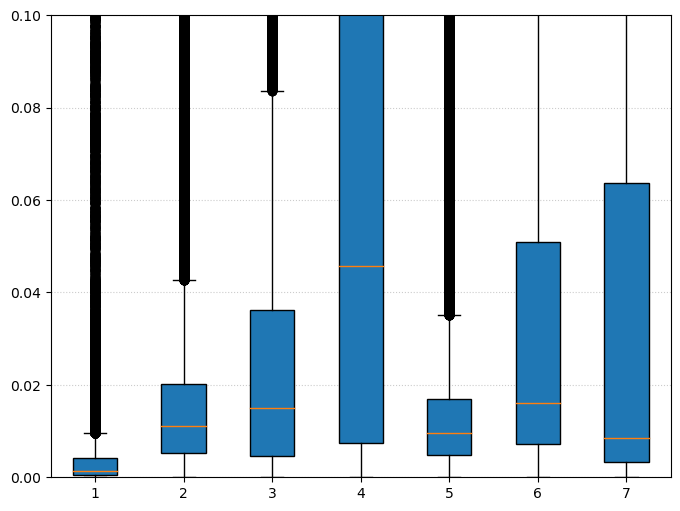

In [301]:
fig = plt.figure(figsize=(8,6))
ax = fig.add_subplot(1,1, 1)

lstm_errors_plot = [lstm_errors[k] for k in range(0, len(lstm_errors.keys()))]
ax.grid(color='#cccccc',linestyle='dotted', axis='y')
bp1 = ax.boxplot(lstm_errors_plot, patch_artist=True)
ax.set_ylim([0, 0.1])

In [302]:
# function to compute the predictions of LSTM
# horizon is fixed at training
# we use test_files to be close to the promp predictor
# we need the right scaler
# array.reshape(-1, 1) if your data has a single feature or array.reshape(1, -1) if it contains a single sample
def model_prediction(model, scaler, test_file:str, dof, skip_data):
    model.eval()
    original = np.loadtxt(test_file, delimiter=',')[::skip_data, dof].reshape(-1, 1)
    original_scaled = scaler.transform(original)
    all_preds = []
    indices = []     
    # for all episodes (replications of the task)
    for i in tqdm(range(train_periods, original_scaled.shape[0])):
        preds = []
        with torch.no_grad():
            input_vector = torch.Tensor(original_scaled[i-train_periods:i].reshape(1, -1))
            predictions, _ = model(input_vector)
            predictions = scaler.inverse_transform(np.array(predictions.reshape(-1,1)))
            #predictions = predictions.reshape(-1, 1)
            preds += [predictions[-1].item()]
            indices += [(i + train_periods) * skip_data]
        all_preds += [preds]
    return np.array(all_preds), np.array(indices)



100%|██████████| 125/125 [00:00<00:00, 1857.46it/s]


200


100%|██████████| 95/95 [01:33<00:00,  1.02it/s]


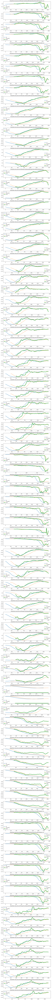

In [303]:
# plot to check
dof = 2
g = glob.glob(f"{data_path}/*/p*.csv")
preds = []
for i in range(len(g)):
    preds += [model_prediction(lstm_models[dof][0], train_data[dof].scaler, g[i], dof, skip_data)]

fig = plt.figure(figsize=(10,2 * len(g)))
print(train_periods * skip_data)
for k in tqdm(range(len(g))):
    f = g[k]
    ax = fig.add_subplot(len(g), 1, k + 1)
    original = np.loadtxt(f, delimiter=',')[:,dof]
    original = np.loadtxt(f, delimiter=',')[:, dof].reshape(-1, 1)
    p, indices = preds[k]
    ax.plot(np.arange(original.shape[0]), original, lw=2, label='gt')
    ax.plot(np.arange(original.shape[0]) + train_periods * skip_data, original, '--', lw=2, label='gt shifted')
    ax.set_title(f)

    ax.plot(indices, p, lw=4, label='pred')
    ax.legend()
    fig.tight_layout()

## Comparison of predictions

In [304]:



def prediction_task(task:str):
    n_dofs = np.loadtxt(glob.glob(f'{data_path}/{task}/p*.csv')[0], delimiter=',').shape[1]

    pred_promp = collections.defaultdict(list)
    pred_lstm = collections.defaultdict(list)

    g = glob.glob(f'{data_path}/{task}/p*.csv') # we will only keep the first half for training
    training_trajs = ' '.join(g[0:int(0.5 * len(g)) + 1]) # convert to a list of string for command line
    testing_trajs = g[int(0.5 * len(g)) + 1:]
    gt =  collections.defaultdict(list)

    for dof in range(0, n_dofs):
        print(f"Task: {task} / DOF {dof}...")
        for i in tqdm(range(len(testing_trajs))):
            print(f"{i}/{len(testing_trajs)}")
            p_l = []
            for j in range(len(lstm_models[dof])):
                p_l += [model_prediction(lstm_models[dof][j], train_data[dof].scaler, testing_trajs[i], dof, skip_data)]
            pred_lstm[dof] += [p_l]
            pred_promp[dof] += [promp_prediction(horizon, dof, training_trajs, testing_trajs[i], 20)]
            gt[dof] += [np.loadtxt(testing_trajs[i], delimiter=',')[:,dof]]
    return pred_promp, pred_lstm, gt


In [305]:
task_list = [x.split('/')[-1] for x in glob.glob(f'{data_path}/*')]
print(task_list)

all_preds_promp = {}
all_preds_lstm = {}
gt = {}


task = 'PlaceBoxDown'
all_preds_promp[task], all_preds_lstm[task], gt[task] = prediction_task(task)


['PlaceBoxDown', 'BottleTable', 'PickBoxMid', 'PickBoxLow', 'PlaceBoxTable', 'BottleBox', 'PlaceBoxSide', 'PlaceBoxHigh', 'PickBoxTable']
Task: PlaceBoxDown / DOF 0...


  0%|          | 0/4 [00:00<?, ?it/s]

0/4


 25%|██▌       | 1/4 [00:56<02:48, 56.02s/it]

1/4


 50%|█████     | 2/4 [01:53<01:54, 57.12s/it]

2/4


 75%|███████▌  | 3/4 [02:56<00:59, 59.48s/it]

3/4


100%|██████████| 4/4 [03:52<00:00, 58.23s/it]


Task: PlaceBoxDown / DOF 1...


  0%|          | 0/4 [00:00<?, ?it/s]

0/4


 25%|██▌       | 1/4 [00:58<02:56, 58.67s/it]

1/4


 50%|█████     | 2/4 [01:55<01:54, 57.30s/it]

2/4


 75%|███████▌  | 3/4 [02:58<01:00, 60.04s/it]

3/4


100%|██████████| 4/4 [04:00<00:00, 60.14s/it]


Task: PlaceBoxDown / DOF 2...


  0%|          | 0/4 [00:00<?, ?it/s]

0/4


 25%|██▌       | 1/4 [00:59<02:57, 59.31s/it]

1/4


 50%|█████     | 2/4 [01:58<01:57, 58.99s/it]

2/4


 75%|███████▌  | 3/4 [03:01<01:00, 60.90s/it]

3/4


100%|██████████| 4/4 [04:01<00:00, 60.39s/it]


Task: PlaceBoxDown / DOF 3...


  0%|          | 0/4 [00:00<?, ?it/s]

0/4


 25%|██▌       | 1/4 [00:58<02:56, 58.92s/it]

1/4


 50%|█████     | 2/4 [01:56<01:56, 58.36s/it]

2/4


 75%|███████▌  | 3/4 [03:02<01:01, 61.67s/it]

3/4


100%|██████████| 4/4 [04:03<00:00, 60.84s/it]


Task: PlaceBoxDown / DOF 4...


  0%|          | 0/4 [00:00<?, ?it/s]

0/4


 25%|██▌       | 1/4 [00:58<02:56, 58.96s/it]

1/4


 50%|█████     | 2/4 [01:55<01:55, 57.69s/it]

2/4


 75%|███████▌  | 3/4 [02:59<01:00, 60.25s/it]

3/4


100%|██████████| 4/4 [03:59<00:00, 59.77s/it]


Task: PlaceBoxDown / DOF 5...


  0%|          | 0/4 [00:00<?, ?it/s]

0/4


 25%|██▌       | 1/4 [01:01<03:04, 61.50s/it]

1/4


 50%|█████     | 2/4 [02:00<01:59, 59.92s/it]

2/4


 75%|███████▌  | 3/4 [03:07<01:03, 63.10s/it]

3/4


100%|██████████| 4/4 [04:11<00:00, 62.76s/it]


Task: PlaceBoxDown / DOF 6...


  0%|          | 0/4 [00:00<?, ?it/s]

0/4


 25%|██▌       | 1/4 [01:01<03:04, 61.64s/it]

1/4


 50%|█████     | 2/4 [02:02<02:02, 61.21s/it]

2/4


 75%|███████▌  | 3/4 [03:07<01:02, 62.89s/it]

3/4


100%|██████████| 4/4 [04:09<00:00, 62.31s/it]


In [306]:
def plot_prediction(task, preds_promp, preds_lstm):
    g = glob.glob(f'{data_path}/{task}/p*.csv')
    g = g[int(0.5 * len(g))+1:] # get the testing only
    fig = plt.figure(figsize=(4 * 7, 2 * len(g)))
    n = 0
    for k in tqdm(range(len(g))): # for each replication of the task
        f = g[k]
        original = np.loadtxt(f, delimiter=',')
        for dof in range(0, original.shape[1]): # for each degree of freedom
            gt = original[:, dof].reshape(-1, 1)
            ax = fig.add_subplot(len(preds_promp[0]), original.shape[1], n + 1)
            n += 1
            # GT
            ax.plot(np.arange(gt.shape[0]), gt, lw=4, label='Ground truth', color='blue')
            ax.plot(np.arange(gt.shape[0]) + train_periods * skip_data, gt, '--', lw=2, label='Delayed', color='blue')
            
            # LSTM
            for i in range(len(preds_lstm[dof][k])): # for each replicate of the LSTM
                p, indices = preds_lstm[dof][k][i]
                if (i == 0):
                    ax.plot(indices, p, lw=2, label='LSTM', alpha=0.5, color='orange')
                else:
                    ax.plot(indices, p, lw=2, alpha=0.5, color='orange')

            # ProMP
            p = preds_promp[dof][k]
            ax.plot(p[:,0], p[:,1], lw=2, label='ProMP', color='red')

            # tuning
            #ax.set_title(f)
            #ax.legend()
            ax.grid(axis='y', color="0.9", linestyle='-', linewidth=1)
            ax.set_xlim((0, original.shape[0]))
            ax.spines['top'].set_visible(False)
            ax.spines['right'].set_visible(False)
            ax.spines['left'].set_visible(False)
            ax.spines['bottom'].set_linewidth(2)

    fig.tight_layout()
    fig.savefig(f'promp_lstm_{task}_{horizon}.pdf')

PlaceBoxDown


100%|██████████| 4/4 [00:01<00:00,  3.59it/s]


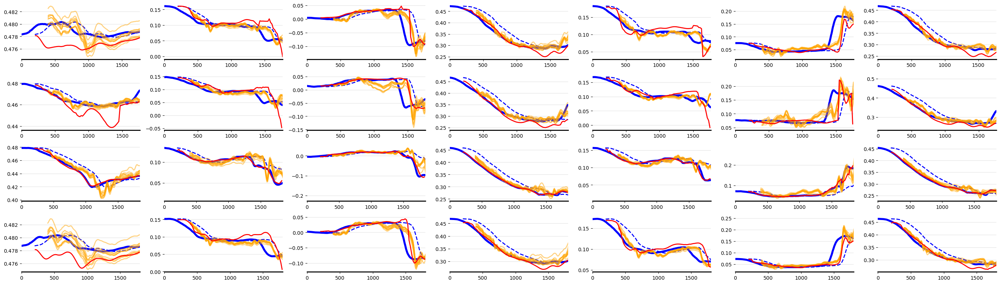

In [307]:
print(task)
plot_prediction(task, all_preds_promp[task], all_preds_lstm[task])

In [308]:
# ['PlaceBoxDown', 'BottleTable', 'PickBoxMid', 'PickBoxLow', 'PlaceBoxTable', 'BottleBox', 'PlaceBoxSide', 'PlaceBoxHigh', 'PickBoxTable']
task = 'BottleTable'
all_preds_promp[task], all_preds_lstm[task], gt[task] = prediction_task(task)

Task: BottleTable / DOF 0...


  0%|          | 0/7 [00:00<?, ?it/s]

0/7


 14%|█▍        | 1/7 [00:49<04:55, 49.27s/it]

1/7


 29%|██▊       | 2/7 [01:36<04:00, 48.08s/it]

2/7


 43%|████▎     | 3/7 [02:31<03:24, 51.17s/it]

3/7


 57%|█████▋    | 4/7 [03:19<02:29, 49.95s/it]

4/7


 71%|███████▏  | 5/7 [04:09<01:39, 49.85s/it]

5/7


 86%|████████▌ | 6/7 [04:53<00:48, 48.01s/it]

6/7


100%|██████████| 7/7 [05:40<00:00, 48.61s/it]


Task: BottleTable / DOF 1...


  0%|          | 0/7 [00:00<?, ?it/s]

0/7


 14%|█▍        | 1/7 [00:48<04:53, 48.84s/it]

1/7


 29%|██▊       | 2/7 [01:37<04:04, 49.00s/it]

2/7


 43%|████▎     | 3/7 [02:29<03:20, 50.17s/it]

3/7


 57%|█████▋    | 4/7 [03:21<02:32, 50.74s/it]

4/7


 71%|███████▏  | 5/7 [04:12<01:41, 50.95s/it]

5/7


 86%|████████▌ | 6/7 [04:59<00:49, 49.78s/it]

6/7


100%|██████████| 7/7 [05:49<00:00, 49.90s/it]


Task: BottleTable / DOF 2...


  0%|          | 0/7 [00:00<?, ?it/s]

0/7


 14%|█▍        | 1/7 [00:48<04:52, 48.80s/it]

1/7


 29%|██▊       | 2/7 [01:37<04:03, 48.71s/it]

2/7


 43%|████▎     | 3/7 [02:26<03:15, 48.82s/it]

3/7


 57%|█████▋    | 4/7 [03:17<02:28, 49.53s/it]

4/7


 71%|███████▏  | 5/7 [04:08<01:40, 50.32s/it]

5/7


 86%|████████▌ | 6/7 [04:54<00:48, 48.68s/it]

6/7


100%|██████████| 7/7 [05:41<00:00, 48.84s/it]


Task: BottleTable / DOF 3...


  0%|          | 0/7 [00:00<?, ?it/s]

0/7


 14%|█▍        | 1/7 [00:45<04:30, 45.09s/it]

1/7


 29%|██▊       | 2/7 [01:33<03:54, 46.86s/it]

2/7


 43%|████▎     | 3/7 [02:23<03:13, 48.27s/it]

3/7


 57%|█████▋    | 4/7 [03:15<02:29, 49.84s/it]

4/7


 71%|███████▏  | 5/7 [04:03<01:38, 49.23s/it]

5/7


 86%|████████▌ | 6/7 [04:49<00:48, 48.15s/it]

6/7


100%|██████████| 7/7 [05:37<00:00, 48.24s/it]


Task: BottleTable / DOF 4...


  0%|          | 0/7 [00:00<?, ?it/s]

0/7


 14%|█▍        | 1/7 [00:48<04:53, 48.99s/it]

1/7


 29%|██▊       | 2/7 [01:35<03:57, 47.51s/it]

2/7


 43%|████▎     | 3/7 [02:24<03:13, 48.29s/it]

3/7


 57%|█████▋    | 4/7 [03:15<02:27, 49.24s/it]

4/7


 71%|███████▏  | 5/7 [04:04<01:38, 49.22s/it]

5/7


 86%|████████▌ | 6/7 [04:51<00:48, 48.35s/it]

6/7


100%|██████████| 7/7 [05:39<00:00, 48.55s/it]


Task: BottleTable / DOF 5...


  0%|          | 0/7 [00:00<?, ?it/s]

0/7


 14%|█▍        | 1/7 [00:51<05:09, 51.65s/it]

1/7


 29%|██▊       | 2/7 [01:39<04:06, 49.25s/it]

2/7


 43%|████▎     | 3/7 [02:30<03:20, 50.23s/it]

3/7


 57%|█████▋    | 4/7 [03:22<02:32, 50.87s/it]

4/7


 71%|███████▏  | 5/7 [04:13<01:42, 51.06s/it]

5/7


 86%|████████▌ | 6/7 [04:58<00:48, 48.73s/it]

6/7


100%|██████████| 7/7 [05:47<00:00, 49.64s/it]


Task: BottleTable / DOF 6...


  0%|          | 0/7 [00:00<?, ?it/s]

0/7


 14%|█▍        | 1/7 [00:47<04:42, 47.03s/it]

1/7


 29%|██▊       | 2/7 [01:35<03:59, 47.91s/it]

2/7


 43%|████▎     | 3/7 [02:28<03:21, 50.38s/it]

3/7


 57%|█████▋    | 4/7 [03:17<02:29, 49.77s/it]

4/7


 71%|███████▏  | 5/7 [04:11<01:42, 51.22s/it]

5/7


 86%|████████▌ | 6/7 [05:00<00:50, 50.51s/it]

6/7


100%|██████████| 7/7 [05:49<00:00, 49.88s/it]


100%|██████████| 7/7 [00:01<00:00,  5.27it/s]


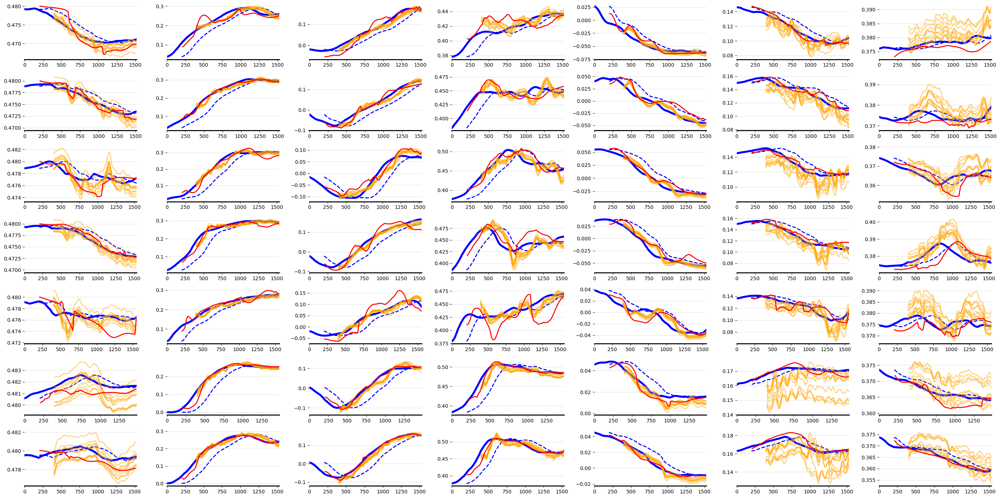

In [309]:
plot_prediction(task, all_preds_promp[task], all_preds_lstm[task])

In [310]:
task = 'PickBoxMid'
all_preds_promp[task], all_preds_lstm[task], gt[task] = prediction_task(task)

Task: PickBoxMid / DOF 0...


  0%|          | 0/4 [00:00<?, ?it/s]

0/4


 25%|██▌       | 1/4 [00:36<01:49, 36.53s/it]

1/4


 50%|█████     | 2/4 [01:13<01:14, 37.01s/it]

2/4


 75%|███████▌  | 3/4 [01:53<00:37, 37.99s/it]

3/4


100%|██████████| 4/4 [02:31<00:00, 37.79s/it]


Task: PickBoxMid / DOF 1...


  0%|          | 0/4 [00:00<?, ?it/s]

0/4


 25%|██▌       | 1/4 [00:37<01:53, 37.82s/it]

1/4


 50%|█████     | 2/4 [01:16<01:16, 38.21s/it]

2/4


 75%|███████▌  | 3/4 [01:56<00:39, 39.06s/it]

3/4


100%|██████████| 4/4 [02:33<00:00, 38.32s/it]


Task: PickBoxMid / DOF 2...


  0%|          | 0/4 [00:00<?, ?it/s]

0/4


 25%|██▌       | 1/4 [00:37<01:53, 37.97s/it]

1/4


 50%|█████     | 2/4 [01:17<01:17, 38.59s/it]

2/4


 75%|███████▌  | 3/4 [01:56<00:38, 38.96s/it]

3/4


100%|██████████| 4/4 [02:33<00:00, 38.48s/it]


Task: PickBoxMid / DOF 3...


  0%|          | 0/4 [00:00<?, ?it/s]

0/4


 25%|██▌       | 1/4 [00:37<01:51, 37.19s/it]

1/4


 50%|█████     | 2/4 [01:15<01:15, 37.74s/it]

2/4


 75%|███████▌  | 3/4 [01:54<00:38, 38.36s/it]

3/4


100%|██████████| 4/4 [02:32<00:00, 38.11s/it]


Task: PickBoxMid / DOF 4...


  0%|          | 0/4 [00:00<?, ?it/s]

0/4


 25%|██▌       | 1/4 [00:38<01:55, 38.39s/it]

1/4


 50%|█████     | 2/4 [01:16<01:16, 38.34s/it]

2/4


 75%|███████▌  | 3/4 [01:55<00:38, 38.76s/it]

3/4


100%|██████████| 4/4 [02:33<00:00, 38.48s/it]


Task: PickBoxMid / DOF 5...


  0%|          | 0/4 [00:00<?, ?it/s]

0/4


 25%|██▌       | 1/4 [00:38<01:55, 38.34s/it]

1/4


 50%|█████     | 2/4 [01:15<01:15, 37.76s/it]

2/4


 75%|███████▌  | 3/4 [01:54<00:38, 38.30s/it]

3/4


100%|██████████| 4/4 [02:31<00:00, 37.91s/it]


Task: PickBoxMid / DOF 6...


  0%|          | 0/4 [00:00<?, ?it/s]

0/4


 25%|██▌       | 1/4 [00:36<01:50, 36.92s/it]

1/4


 50%|█████     | 2/4 [01:14<01:14, 37.14s/it]

2/4


 75%|███████▌  | 3/4 [01:51<00:37, 37.19s/it]

3/4


100%|██████████| 4/4 [02:27<00:00, 36.93s/it]


100%|██████████| 4/4 [00:00<00:00,  7.89it/s]


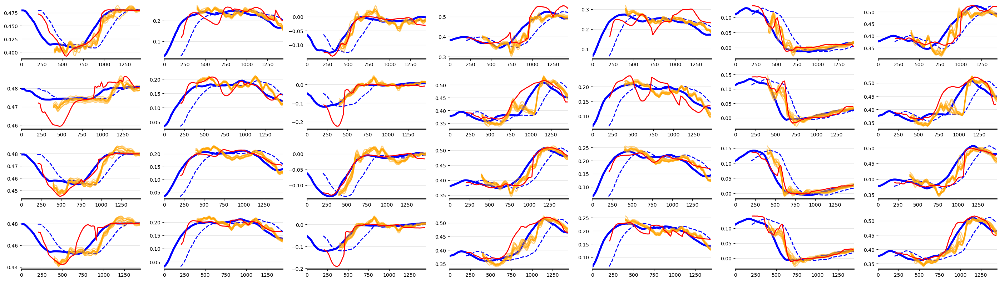

In [311]:
plot_prediction(task, all_preds_promp[task], all_preds_lstm[task])

In [312]:
task = 'PickBoxLow'
all_preds_promp[task], all_preds_lstm[task], gt[task] = prediction_task(task)

Task: PickBoxLow / DOF 0...


  0%|          | 0/4 [00:00<?, ?it/s]

0/4


 25%|██▌       | 1/4 [00:38<01:56, 38.77s/it]

1/4


 50%|█████     | 2/4 [01:15<01:15, 37.74s/it]

2/4


 75%|███████▌  | 3/4 [01:49<00:36, 36.04s/it]

3/4


100%|██████████| 4/4 [02:27<00:00, 36.99s/it]


Task: PickBoxLow / DOF 1...


  0%|          | 0/4 [00:00<?, ?it/s]

0/4


 25%|██▌       | 1/4 [00:37<01:52, 37.51s/it]

1/4


 50%|█████     | 2/4 [01:13<01:13, 36.83s/it]

2/4


 75%|███████▌  | 3/4 [01:47<00:35, 35.33s/it]

3/4


100%|██████████| 4/4 [02:25<00:00, 36.27s/it]


Task: PickBoxLow / DOF 2...


  0%|          | 0/4 [00:00<?, ?it/s]

0/4


 25%|██▌       | 1/4 [00:39<01:59, 39.82s/it]

1/4


 50%|█████     | 2/4 [01:15<01:14, 37.46s/it]

2/4


 75%|███████▌  | 3/4 [01:50<00:36, 36.06s/it]

3/4


100%|██████████| 4/4 [02:27<00:00, 37.00s/it]


Task: PickBoxLow / DOF 3...


  0%|          | 0/4 [00:00<?, ?it/s]

0/4


 25%|██▌       | 1/4 [00:38<01:56, 38.76s/it]

1/4


 50%|█████     | 2/4 [01:14<01:14, 37.12s/it]

2/4


 75%|███████▌  | 3/4 [01:49<00:35, 35.86s/it]

3/4


100%|██████████| 4/4 [02:26<00:00, 36.71s/it]


Task: PickBoxLow / DOF 4...


  0%|          | 0/4 [00:00<?, ?it/s]

0/4


 25%|██▌       | 1/4 [00:37<01:53, 37.94s/it]

1/4


 50%|█████     | 2/4 [01:15<01:14, 37.49s/it]

2/4


 75%|███████▌  | 3/4 [01:48<00:35, 35.83s/it]

3/4


100%|██████████| 4/4 [02:26<00:00, 36.70s/it]


Task: PickBoxLow / DOF 5...


  0%|          | 0/4 [00:00<?, ?it/s]

0/4


 25%|██▌       | 1/4 [00:39<01:59, 39.77s/it]

1/4


 50%|█████     | 2/4 [01:15<01:14, 37.29s/it]

2/4


 75%|███████▌  | 3/4 [01:50<00:36, 36.22s/it]

3/4


100%|██████████| 4/4 [02:28<00:00, 37.02s/it]


Task: PickBoxLow / DOF 6...


  0%|          | 0/4 [00:00<?, ?it/s]

0/4


 25%|██▌       | 1/4 [00:38<01:55, 38.57s/it]

1/4


 50%|█████     | 2/4 [01:14<01:14, 37.14s/it]

2/4


 75%|███████▌  | 3/4 [01:48<00:35, 35.65s/it]

3/4


100%|██████████| 4/4 [02:26<00:00, 36.56s/it]


100%|██████████| 4/4 [00:00<00:00,  7.48it/s]


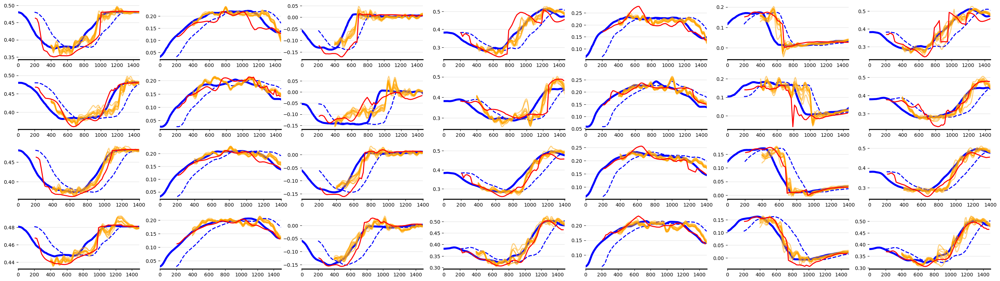

In [313]:
plot_prediction(task, all_preds_promp[task], all_preds_lstm[task])

In [314]:
task = 'PlaceBoxTable'
all_preds_promp[task], all_preds_lstm[task], gt[task] = prediction_task(task)

Task: PlaceBoxTable / DOF 0...


  0%|          | 0/4 [00:00<?, ?it/s]

0/4


 25%|██▌       | 1/4 [00:57<02:53, 57.93s/it]

1/4


 50%|█████     | 2/4 [02:01<02:02, 61.26s/it]

2/4


 75%|███████▌  | 3/4 [03:00<01:00, 60.24s/it]

3/4


100%|██████████| 4/4 [04:02<00:00, 60.60s/it]


Task: PlaceBoxTable / DOF 1...


  0%|          | 0/4 [00:00<?, ?it/s]

0/4


 25%|██▌       | 1/4 [01:00<03:01, 60.54s/it]

1/4


 50%|█████     | 2/4 [02:01<02:01, 60.96s/it]

2/4


 75%|███████▌  | 3/4 [03:03<01:01, 61.22s/it]

3/4


100%|██████████| 4/4 [04:02<00:00, 60.71s/it]


Task: PlaceBoxTable / DOF 2...


  0%|          | 0/4 [00:00<?, ?it/s]

0/4


 25%|██▌       | 1/4 [01:01<03:03, 61.17s/it]

1/4


 50%|█████     | 2/4 [02:02<02:02, 61.04s/it]

2/4


 75%|███████▌  | 3/4 [03:02<01:00, 60.87s/it]

3/4


100%|██████████| 4/4 [04:02<00:00, 60.58s/it]


Task: PlaceBoxTable / DOF 3...


  0%|          | 0/4 [00:00<?, ?it/s]

0/4


 25%|██▌       | 1/4 [00:58<02:56, 58.84s/it]

1/4


 50%|█████     | 2/4 [02:01<02:02, 61.23s/it]

2/4


 75%|███████▌  | 3/4 [03:00<00:59, 59.93s/it]

3/4


100%|██████████| 4/4 [03:58<00:00, 59.67s/it]


Task: PlaceBoxTable / DOF 4...


  0%|          | 0/4 [00:00<?, ?it/s]

0/4


 25%|██▌       | 1/4 [01:01<03:04, 61.34s/it]

1/4


 50%|█████     | 2/4 [02:03<02:03, 61.84s/it]

2/4


 75%|███████▌  | 3/4 [03:06<01:02, 62.23s/it]

3/4


100%|██████████| 4/4 [04:07<00:00, 61.88s/it]


Task: PlaceBoxTable / DOF 5...


  0%|          | 0/4 [00:00<?, ?it/s]

0/4


 25%|██▌       | 1/4 [01:03<03:10, 63.44s/it]

1/4


 50%|█████     | 2/4 [02:05<02:04, 62.47s/it]

2/4


 75%|███████▌  | 3/4 [03:05<01:01, 61.46s/it]

3/4


100%|██████████| 4/4 [04:06<00:00, 61.54s/it]


Task: PlaceBoxTable / DOF 6...


  0%|          | 0/4 [00:00<?, ?it/s]

0/4


 25%|██▌       | 1/4 [00:58<02:55, 58.39s/it]

1/4


 50%|█████     | 2/4 [01:58<01:59, 59.66s/it]

2/4


 75%|███████▌  | 3/4 [02:56<00:58, 58.92s/it]

3/4


100%|██████████| 4/4 [03:55<00:00, 58.87s/it]


100%|██████████| 4/4 [00:01<00:00,  3.31it/s]


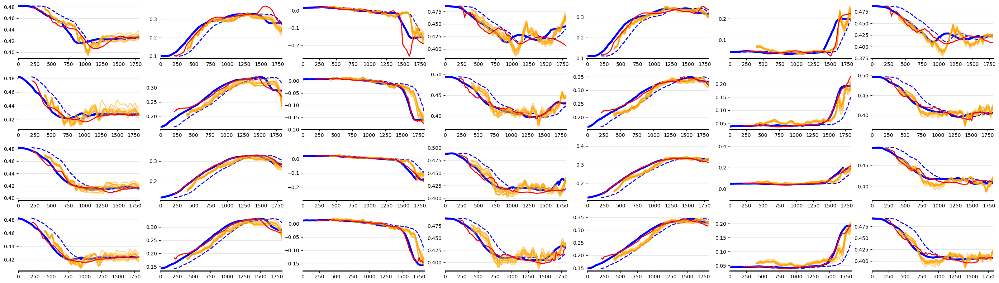

In [315]:
plot_prediction(task, all_preds_promp[task], all_preds_lstm[task])

In [316]:


task = 'PlaceBoxTable'
all_preds_promp[task], all_preds_lstm[task], gt[task] = prediction_task(task)

Task: PlaceBoxTable / DOF 0...


  0%|          | 0/4 [00:00<?, ?it/s]

0/4


 25%|██▌       | 1/4 [00:58<02:55, 58.54s/it]

1/4


 50%|█████     | 2/4 [02:01<02:01, 60.97s/it]

2/4


 75%|███████▌  | 3/4 [03:01<01:00, 60.44s/it]

3/4


100%|██████████| 4/4 [04:03<00:00, 60.75s/it]


Task: PlaceBoxTable / DOF 1...


  0%|          | 0/4 [00:00<?, ?it/s]

0/4


 25%|██▌       | 1/4 [01:02<03:08, 62.89s/it]

1/4


 50%|█████     | 2/4 [02:05<02:05, 62.71s/it]

2/4


 75%|███████▌  | 3/4 [03:06<01:02, 62.04s/it]

3/4


100%|██████████| 4/4 [04:07<00:00, 61.93s/it]


Task: PlaceBoxTable / DOF 2...


  0%|          | 0/4 [00:00<?, ?it/s]

0/4


 25%|██▌       | 1/4 [01:03<03:10, 63.46s/it]

1/4


 50%|█████     | 2/4 [02:04<02:04, 62.03s/it]

2/4


 75%|███████▌  | 3/4 [03:05<01:01, 61.38s/it]

3/4


100%|██████████| 4/4 [04:04<00:00, 61.18s/it]


Task: PlaceBoxTable / DOF 3...


  0%|          | 0/4 [00:00<?, ?it/s]

0/4


 25%|██▌       | 1/4 [00:58<02:54, 58.24s/it]

1/4


 50%|█████     | 2/4 [01:59<02:00, 60.13s/it]

2/4


 75%|███████▌  | 3/4 [02:58<00:59, 59.48s/it]

3/4


100%|██████████| 4/4 [03:56<00:00, 59.20s/it]


Task: PlaceBoxTable / DOF 4...


  0%|          | 0/4 [00:00<?, ?it/s]

0/4


 25%|██▌       | 1/4 [01:01<03:03, 61.15s/it]

1/4


 50%|█████     | 2/4 [02:01<02:01, 60.88s/it]

2/4


 75%|███████▌  | 3/4 [03:03<01:01, 61.02s/it]

3/4


100%|██████████| 4/4 [04:03<00:00, 60.93s/it]


Task: PlaceBoxTable / DOF 5...


  0%|          | 0/4 [00:00<?, ?it/s]

0/4


 25%|██▌       | 1/4 [01:01<03:05, 61.87s/it]

1/4


 50%|█████     | 2/4 [02:03<02:02, 61.46s/it]

2/4


 75%|███████▌  | 3/4 [03:03<01:01, 61.07s/it]

3/4


100%|██████████| 4/4 [04:04<00:00, 61.18s/it]


Task: PlaceBoxTable / DOF 6...


  0%|          | 0/4 [00:00<?, ?it/s]

0/4


 25%|██▌       | 1/4 [00:59<02:57, 59.05s/it]

1/4


 50%|█████     | 2/4 [02:00<02:01, 60.64s/it]

2/4


 75%|███████▌  | 3/4 [02:59<00:59, 59.70s/it]

3/4


100%|██████████| 4/4 [03:58<00:00, 59.51s/it]


100%|██████████| 4/4 [00:00<00:00,  6.23it/s]


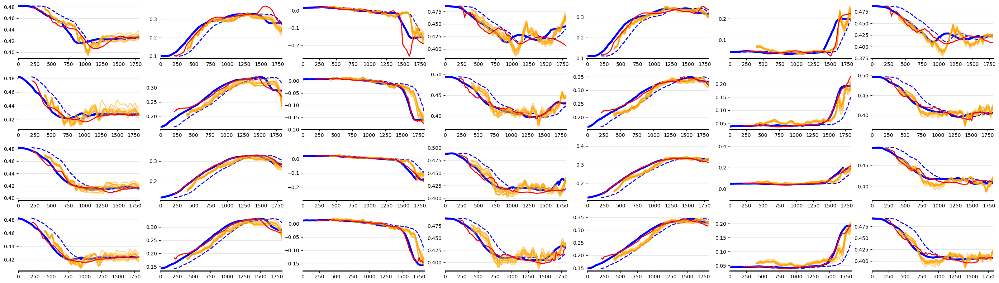

In [317]:
plot_prediction(task, all_preds_promp[task], all_preds_lstm[task])

In [318]:
task = 'BottleBox'
all_preds_promp[task], all_preds_lstm[task], gt[task] = prediction_task(task)

Task: BottleBox / DOF 0...


  0%|          | 0/7 [00:00<?, ?it/s]

0/7


 14%|█▍        | 1/7 [00:44<04:28, 44.70s/it]

1/7


 29%|██▊       | 2/7 [01:27<03:38, 43.63s/it]

2/7


 43%|████▎     | 3/7 [02:12<02:56, 44.22s/it]

3/7


 57%|█████▋    | 4/7 [02:55<02:10, 43.60s/it]

4/7


 71%|███████▏  | 5/7 [03:44<01:31, 45.74s/it]

5/7


 86%|████████▌ | 6/7 [04:35<00:47, 47.53s/it]

6/7


100%|██████████| 7/7 [05:25<00:00, 46.50s/it]


Task: BottleBox / DOF 1...


  0%|          | 0/7 [00:00<?, ?it/s]

0/7


 14%|█▍        | 1/7 [00:44<04:24, 44.02s/it]

1/7


 29%|██▊       | 2/7 [01:28<03:42, 44.42s/it]

2/7


 43%|████▎     | 3/7 [02:15<03:02, 45.53s/it]

3/7


 57%|█████▋    | 4/7 [02:59<02:14, 44.98s/it]

4/7


 71%|███████▏  | 5/7 [03:47<01:32, 46.11s/it]

5/7


 86%|████████▌ | 6/7 [04:36<00:46, 46.96s/it]

6/7


100%|██████████| 7/7 [05:27<00:00, 46.82s/it]


Task: BottleBox / DOF 2...


  0%|          | 0/7 [00:00<?, ?it/s]

0/7


 14%|█▍        | 1/7 [00:43<04:23, 43.88s/it]

1/7


 29%|██▊       | 2/7 [01:26<03:35, 43.11s/it]

2/7


 43%|████▎     | 3/7 [02:11<02:55, 43.93s/it]

3/7


 57%|█████▋    | 4/7 [02:54<02:10, 43.42s/it]

4/7


 71%|███████▏  | 5/7 [03:39<01:28, 44.33s/it]

5/7


 86%|████████▌ | 6/7 [04:28<00:45, 45.69s/it]

6/7


100%|██████████| 7/7 [05:16<00:00, 45.17s/it]


Task: BottleBox / DOF 3...


  0%|          | 0/7 [00:00<?, ?it/s]

0/7


 14%|█▍        | 1/7 [00:44<04:27, 44.62s/it]

1/7


 29%|██▊       | 2/7 [01:27<03:38, 43.79s/it]

2/7


 43%|████▎     | 3/7 [02:13<02:59, 44.75s/it]

3/7


 57%|█████▋    | 4/7 [02:57<02:12, 44.27s/it]

4/7


 71%|███████▏  | 5/7 [03:47<01:32, 46.43s/it]

5/7


 86%|████████▌ | 6/7 [04:38<00:48, 48.12s/it]

6/7


100%|██████████| 7/7 [05:27<00:00, 46.73s/it]


Task: BottleBox / DOF 4...


  0%|          | 0/7 [00:00<?, ?it/s]

0/7


 14%|█▍        | 1/7 [00:43<04:21, 43.51s/it]

1/7


 29%|██▊       | 2/7 [01:26<03:35, 43.10s/it]

2/7


 43%|████▎     | 3/7 [02:11<02:55, 43.85s/it]

3/7


 57%|█████▋    | 4/7 [02:53<02:10, 43.45s/it]

4/7


 71%|███████▏  | 5/7 [03:39<01:28, 44.21s/it]

5/7


 86%|████████▌ | 6/7 [04:26<00:45, 45.16s/it]

6/7


100%|██████████| 7/7 [05:14<00:00, 44.98s/it]


Task: BottleBox / DOF 5...


  0%|          | 0/7 [00:00<?, ?it/s]

0/7


 14%|█▍        | 1/7 [00:44<04:26, 44.37s/it]

1/7


 29%|██▊       | 2/7 [01:27<03:37, 43.51s/it]

2/7


 43%|████▎     | 3/7 [02:13<02:58, 44.53s/it]

3/7


 57%|█████▋    | 4/7 [02:55<02:11, 43.87s/it]

4/7


 71%|███████▏  | 5/7 [03:45<01:31, 45.81s/it]

5/7


 86%|████████▌ | 6/7 [04:35<00:47, 47.29s/it]

6/7


100%|██████████| 7/7 [05:24<00:00, 46.31s/it]


Task: BottleBox / DOF 6...


  0%|          | 0/7 [00:00<?, ?it/s]

0/7


 14%|█▍        | 1/7 [00:43<04:23, 43.96s/it]

1/7


 29%|██▊       | 2/7 [01:27<03:38, 43.77s/it]

2/7


 43%|████▎     | 3/7 [02:13<02:58, 44.54s/it]

3/7


 57%|█████▋    | 4/7 [02:56<02:12, 44.17s/it]

4/7


 71%|███████▏  | 5/7 [03:46<01:32, 46.11s/it]

5/7


 86%|████████▌ | 6/7 [04:38<00:48, 48.06s/it]

6/7


100%|██████████| 7/7 [05:28<00:00, 46.97s/it]


In [319]:
print(task_list)
print(all_preds_promp.keys())
task = 'BottleBox'
all_preds_promp[task], all_preds_lstm[task], gt[task] = prediction_task(task)

['PlaceBoxDown', 'BottleTable', 'PickBoxMid', 'PickBoxLow', 'PlaceBoxTable', 'BottleBox', 'PlaceBoxSide', 'PlaceBoxHigh', 'PickBoxTable']
dict_keys(['PlaceBoxDown', 'BottleTable', 'PickBoxMid', 'PickBoxLow', 'PlaceBoxTable', 'BottleBox'])
Task: BottleBox / DOF 0...


  0%|          | 0/7 [00:00<?, ?it/s]

0/7


 14%|█▍        | 1/7 [00:45<04:31, 45.32s/it]

1/7


 29%|██▊       | 2/7 [01:28<03:39, 43.98s/it]

2/7


 43%|████▎     | 3/7 [02:14<03:00, 45.08s/it]

3/7


 57%|█████▋    | 4/7 [02:59<02:14, 44.83s/it]

4/7


 71%|███████▏  | 5/7 [03:48<01:33, 46.62s/it]

5/7


 86%|████████▌ | 6/7 [04:39<00:48, 48.06s/it]

6/7


100%|██████████| 7/7 [05:30<00:00, 47.16s/it]


Task: BottleBox / DOF 1...


  0%|          | 0/7 [00:00<?, ?it/s]

0/7


 14%|█▍        | 1/7 [00:44<04:24, 44.12s/it]

1/7


 29%|██▊       | 2/7 [01:28<03:41, 44.27s/it]

2/7


 43%|████▎     | 3/7 [02:17<03:05, 46.35s/it]

3/7


 57%|█████▋    | 4/7 [03:02<02:18, 46.03s/it]

4/7


 71%|███████▏  | 5/7 [03:54<01:36, 48.01s/it]

5/7


 86%|████████▌ | 6/7 [04:44<00:48, 48.76s/it]

6/7


100%|██████████| 7/7 [05:35<00:00, 47.96s/it]


Task: BottleBox / DOF 2...


  0%|          | 0/7 [00:00<?, ?it/s]

0/7


 14%|█▍        | 1/7 [00:43<04:22, 43.79s/it]

1/7


 29%|██▊       | 2/7 [01:26<03:35, 43.07s/it]

2/7


 43%|████▎     | 3/7 [02:11<02:55, 43.89s/it]

3/7


 57%|█████▋    | 4/7 [02:55<02:11, 43.92s/it]

4/7


 71%|███████▏  | 5/7 [03:41<01:29, 44.94s/it]

5/7


 86%|████████▌ | 6/7 [04:30<00:46, 46.04s/it]

6/7


100%|██████████| 7/7 [05:18<00:00, 45.47s/it]


Task: BottleBox / DOF 3...


  0%|          | 0/7 [00:00<?, ?it/s]

0/7


 14%|█▍        | 1/7 [00:44<04:24, 44.01s/it]

1/7


 29%|██▊       | 2/7 [01:26<03:36, 43.38s/it]

2/7


 43%|████▎     | 3/7 [02:12<02:57, 44.48s/it]

3/7


 57%|█████▋    | 4/7 [02:56<02:12, 44.04s/it]

4/7


 71%|███████▏  | 5/7 [03:45<01:32, 46.07s/it]

5/7


 86%|████████▌ | 6/7 [04:36<00:47, 47.75s/it]

6/7


100%|██████████| 7/7 [05:24<00:00, 46.40s/it]


Task: BottleBox / DOF 4...


  0%|          | 0/7 [00:00<?, ?it/s]

0/7


 14%|█▍        | 1/7 [00:44<04:24, 44.06s/it]

1/7


 29%|██▊       | 2/7 [01:26<03:36, 43.33s/it]

2/7


 43%|████▎     | 3/7 [02:11<02:55, 43.85s/it]

3/7


 57%|█████▋    | 4/7 [02:54<02:10, 43.51s/it]

4/7


 71%|███████▏  | 5/7 [03:39<01:28, 44.23s/it]

5/7


 86%|████████▌ | 6/7 [04:26<00:45, 45.14s/it]

6/7


100%|██████████| 7/7 [05:14<00:00, 44.97s/it]


Task: BottleBox / DOF 5...


  0%|          | 0/7 [00:00<?, ?it/s]

0/7


 14%|█▍        | 1/7 [00:44<04:27, 44.63s/it]

1/7


 29%|██▊       | 2/7 [01:28<03:40, 44.04s/it]

2/7


 43%|████▎     | 3/7 [02:14<03:00, 45.16s/it]

3/7


 57%|█████▋    | 4/7 [02:58<02:13, 44.45s/it]

4/7


 71%|███████▏  | 5/7 [03:47<01:32, 46.21s/it]

5/7


 86%|████████▌ | 6/7 [04:38<00:47, 47.73s/it]

6/7


100%|██████████| 7/7 [05:27<00:00, 46.82s/it]


Task: BottleBox / DOF 6...


  0%|          | 0/7 [00:00<?, ?it/s]

0/7


 14%|█▍        | 1/7 [00:44<04:25, 44.18s/it]

1/7


 29%|██▊       | 2/7 [01:28<03:40, 44.04s/it]

2/7


 43%|████▎     | 3/7 [02:13<02:57, 44.50s/it]

3/7


 57%|█████▋    | 4/7 [02:56<02:12, 44.06s/it]

4/7


 71%|███████▏  | 5/7 [03:46<01:32, 46.30s/it]

5/7


 86%|████████▌ | 6/7 [04:39<00:48, 48.32s/it]

6/7


100%|██████████| 7/7 [05:30<00:00, 47.17s/it]


100%|██████████| 7/7 [00:00<00:00,  7.98it/s]


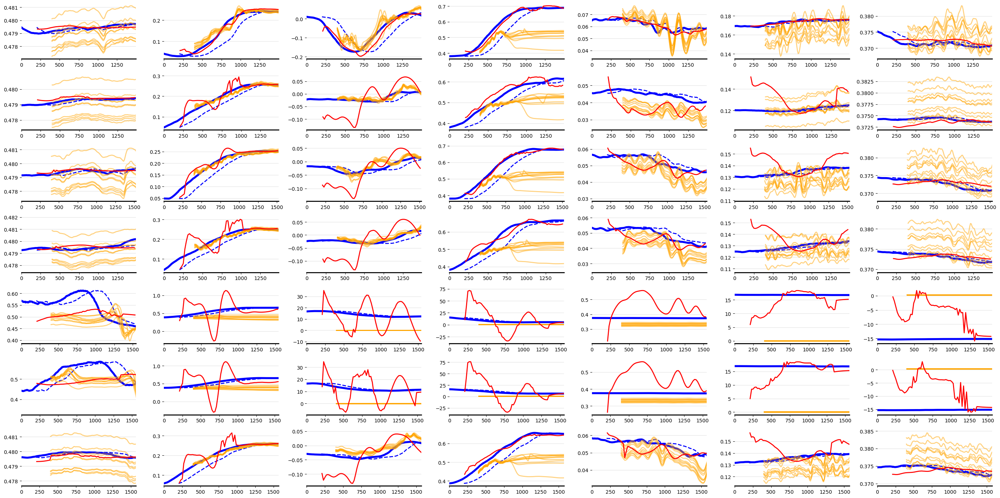

In [320]:
plot_prediction(task, all_preds_promp[task], all_preds_lstm[task])

In [321]:
print(task_list)
print(all_preds_promp.keys())
task = 'PlaceBoxSide'
all_preds_promp[task], all_preds_lstm[task], gt[task] = prediction_task(task)

['PlaceBoxDown', 'BottleTable', 'PickBoxMid', 'PickBoxLow', 'PlaceBoxTable', 'BottleBox', 'PlaceBoxSide', 'PlaceBoxHigh', 'PickBoxTable']
dict_keys(['PlaceBoxDown', 'BottleTable', 'PickBoxMid', 'PickBoxLow', 'PlaceBoxTable', 'BottleBox'])
Task: PlaceBoxSide / DOF 0...


  0%|          | 0/4 [00:00<?, ?it/s]

0/4


 25%|██▌       | 1/4 [01:01<03:03, 61.33s/it]

1/4


 50%|█████     | 2/4 [02:04<02:04, 62.24s/it]

2/4


 75%|███████▌  | 3/4 [03:07<01:02, 62.86s/it]

3/4


100%|██████████| 4/4 [04:10<00:00, 62.64s/it]


Task: PlaceBoxSide / DOF 1...


  0%|          | 0/4 [00:00<?, ?it/s]

0/4


 25%|██▌       | 1/4 [01:01<03:05, 61.94s/it]

1/4


 50%|█████     | 2/4 [02:01<02:00, 60.49s/it]

2/4


 75%|███████▌  | 3/4 [03:03<01:01, 61.33s/it]

3/4


100%|██████████| 4/4 [04:06<00:00, 61.57s/it]


Task: PlaceBoxSide / DOF 2...


  0%|          | 0/4 [00:00<?, ?it/s]

0/4


 25%|██▌       | 1/4 [01:02<03:06, 62.10s/it]

1/4


 50%|█████     | 2/4 [02:03<02:03, 61.57s/it]

2/4


 75%|███████▌  | 3/4 [03:09<01:03, 63.46s/it]

3/4


100%|██████████| 4/4 [04:13<00:00, 63.46s/it]


Task: PlaceBoxSide / DOF 3...


  0%|          | 0/4 [00:00<?, ?it/s]

0/4


 25%|██▌       | 1/4 [01:02<03:06, 62.33s/it]

1/4


 50%|█████     | 2/4 [02:05<02:05, 62.79s/it]

2/4


 75%|███████▌  | 3/4 [03:08<01:03, 63.09s/it]

3/4


100%|██████████| 4/4 [04:12<00:00, 63.09s/it]


Task: PlaceBoxSide / DOF 4...


  0%|          | 0/4 [00:00<?, ?it/s]

0/4


 25%|██▌       | 1/4 [01:01<03:04, 61.66s/it]

1/4


 50%|█████     | 2/4 [02:02<02:02, 61.37s/it]

2/4


 75%|███████▌  | 3/4 [03:06<01:02, 62.23s/it]

3/4


100%|██████████| 4/4 [04:09<00:00, 62.31s/it]


Task: PlaceBoxSide / DOF 5...


  0%|          | 0/4 [00:00<?, ?it/s]

0/4


 25%|██▌       | 1/4 [01:02<03:07, 62.41s/it]

1/4


 50%|█████     | 2/4 [02:04<02:04, 62.01s/it]

2/4


 75%|███████▌  | 3/4 [03:09<01:03, 63.49s/it]

3/4


100%|██████████| 4/4 [04:14<00:00, 63.68s/it]


Task: PlaceBoxSide / DOF 6...


  0%|          | 0/4 [00:00<?, ?it/s]

0/4


 25%|██▌       | 1/4 [01:01<03:05, 61.92s/it]

1/4


 50%|█████     | 2/4 [02:05<02:05, 62.70s/it]

2/4


 75%|███████▌  | 3/4 [03:07<01:02, 62.44s/it]

3/4


100%|██████████| 4/4 [04:10<00:00, 62.64s/it]


100%|██████████| 4/4 [00:00<00:00,  5.49it/s]


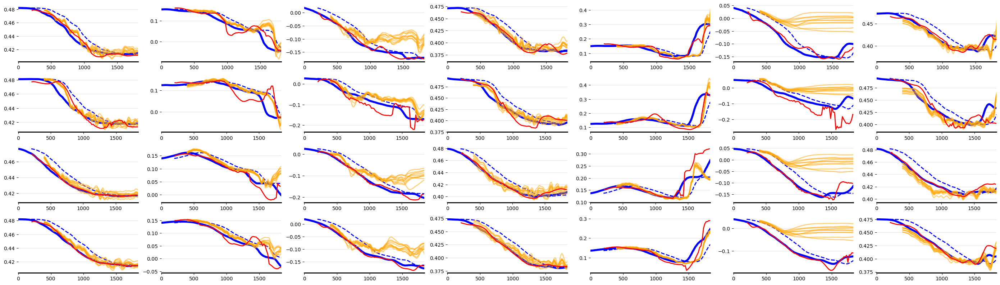

In [322]:
plot_prediction(task, all_preds_promp[task], all_preds_lstm[task])

In [323]:
task = 'PlaceBoxHigh'
all_preds_promp[task], all_preds_lstm[task], gt[task] = prediction_task(task)

Task: PlaceBoxHigh / DOF 0...


  0%|          | 0/4 [00:00<?, ?it/s]

0/4


 25%|██▌       | 1/4 [00:58<02:55, 58.35s/it]

1/4


 50%|█████     | 2/4 [01:58<01:59, 59.70s/it]

2/4


 75%|███████▌  | 3/4 [02:55<00:58, 58.12s/it]

3/4


100%|██████████| 4/4 [03:53<00:00, 58.32s/it]


Task: PlaceBoxHigh / DOF 1...


  0%|          | 0/4 [00:00<?, ?it/s]

0/4


 25%|██▌       | 1/4 [00:59<02:59, 59.70s/it]

1/4


 50%|█████     | 2/4 [02:02<02:02, 61.26s/it]

2/4


 75%|███████▌  | 3/4 [02:58<00:59, 59.19s/it]

3/4


100%|██████████| 4/4 [03:59<00:00, 59.83s/it]


Task: PlaceBoxHigh / DOF 2...


  0%|          | 0/4 [00:00<?, ?it/s]

0/4


 25%|██▌       | 1/4 [00:59<02:57, 59.15s/it]

1/4


 50%|█████     | 2/4 [02:01<02:01, 60.84s/it]

2/4


 75%|███████▌  | 3/4 [02:57<00:58, 58.93s/it]

3/4


100%|██████████| 4/4 [03:59<00:00, 59.95s/it]


Task: PlaceBoxHigh / DOF 3...


  0%|          | 0/4 [00:00<?, ?it/s]

0/4


 25%|██▌       | 1/4 [01:00<03:02, 60.75s/it]

1/4


 50%|█████     | 2/4 [02:04<02:04, 62.34s/it]

2/4


 75%|███████▌  | 3/4 [03:01<00:59, 60.00s/it]

3/4


100%|██████████| 4/4 [04:02<00:00, 60.69s/it]


Task: PlaceBoxHigh / DOF 4...


  0%|          | 0/4 [00:00<?, ?it/s]

0/4


 25%|██▌       | 1/4 [00:59<02:58, 59.59s/it]

1/4


 50%|█████     | 2/4 [02:02<02:02, 61.48s/it]

2/4


 75%|███████▌  | 3/4 [03:00<00:59, 59.87s/it]

3/4


100%|██████████| 4/4 [04:01<00:00, 60.38s/it]


Task: PlaceBoxHigh / DOF 5...


  0%|          | 0/4 [00:00<?, ?it/s]

0/4


 25%|██▌       | 1/4 [00:58<02:56, 58.87s/it]

1/4


 50%|█████     | 2/4 [02:04<02:05, 62.78s/it]

2/4


 75%|███████▌  | 3/4 [03:02<01:00, 60.49s/it]

3/4


100%|██████████| 4/4 [04:04<00:00, 61.16s/it]


Task: PlaceBoxHigh / DOF 6...


  0%|          | 0/4 [00:00<?, ?it/s]

0/4


 25%|██▌       | 1/4 [01:01<03:03, 61.22s/it]

1/4


 50%|█████     | 2/4 [02:04<02:04, 62.45s/it]

2/4


 75%|███████▌  | 3/4 [03:01<01:00, 60.06s/it]

3/4


100%|██████████| 4/4 [04:03<00:00, 60.76s/it]


100%|██████████| 4/4 [00:00<00:00,  6.26it/s]


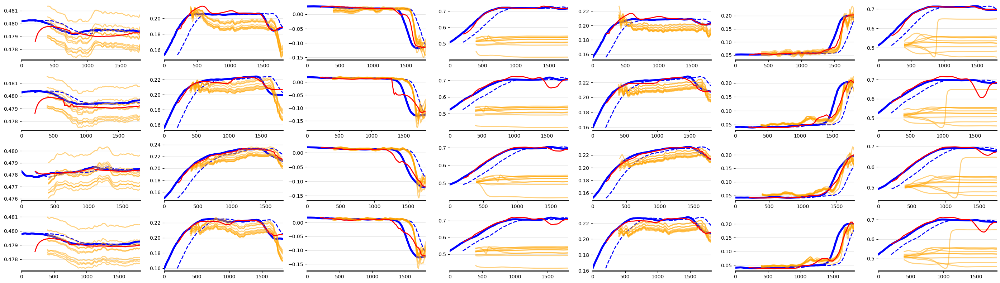

In [324]:
plot_prediction(task, all_preds_promp[task], all_preds_lstm[task])

In [325]:
task = 'PickBoxTable'
all_preds_promp[task], all_preds_lstm[task], gt[task] = prediction_task(task)

Task: PickBoxTable / DOF 0...


  0%|          | 0/4 [00:00<?, ?it/s]

0/4


 25%|██▌       | 1/4 [00:33<01:41, 33.87s/it]

1/4


 50%|█████     | 2/4 [01:09<01:09, 34.69s/it]

2/4


 75%|███████▌  | 3/4 [01:44<00:35, 35.03s/it]

3/4


100%|██████████| 4/4 [02:20<00:00, 35.18s/it]


Task: PickBoxTable / DOF 1...


  0%|          | 0/4 [00:00<?, ?it/s]

0/4


 25%|██▌       | 1/4 [00:35<01:45, 35.32s/it]

1/4


 50%|█████     | 2/4 [01:11<01:11, 35.56s/it]

2/4


 75%|███████▌  | 3/4 [01:46<00:35, 35.44s/it]

3/4


100%|██████████| 4/4 [02:22<00:00, 35.56s/it]


Task: PickBoxTable / DOF 2...


  0%|          | 0/4 [00:00<?, ?it/s]

0/4


 25%|██▌       | 1/4 [00:35<01:45, 35.22s/it]

1/4


 50%|█████     | 2/4 [01:10<01:09, 35.00s/it]

2/4


 75%|███████▌  | 3/4 [01:45<00:35, 35.09s/it]

3/4


100%|██████████| 4/4 [02:21<00:00, 35.46s/it]


Task: PickBoxTable / DOF 3...


  0%|          | 0/4 [00:00<?, ?it/s]

0/4


 25%|██▌       | 1/4 [00:35<01:46, 35.34s/it]

1/4


 50%|█████     | 2/4 [01:10<01:10, 35.26s/it]

2/4


 75%|███████▌  | 3/4 [01:46<00:35, 35.39s/it]

3/4


100%|██████████| 4/4 [02:22<00:00, 35.63s/it]


Task: PickBoxTable / DOF 4...


  0%|          | 0/4 [00:00<?, ?it/s]

0/4


 25%|██▌       | 1/4 [00:34<01:44, 34.96s/it]

1/4


 50%|█████     | 2/4 [01:09<01:09, 34.63s/it]

2/4


 75%|███████▌  | 3/4 [01:44<00:34, 34.82s/it]

3/4


100%|██████████| 4/4 [02:20<00:00, 35.22s/it]


Task: PickBoxTable / DOF 5...


  0%|          | 0/4 [00:00<?, ?it/s]

0/4


 25%|██▌       | 1/4 [00:35<01:46, 35.61s/it]

1/4


 50%|█████     | 2/4 [01:11<01:11, 35.57s/it]

2/4


 75%|███████▌  | 3/4 [01:47<00:35, 35.84s/it]

3/4


100%|██████████| 4/4 [02:23<00:00, 35.89s/it]


Task: PickBoxTable / DOF 6...


  0%|          | 0/4 [00:00<?, ?it/s]

0/4


 25%|██▌       | 1/4 [00:35<01:47, 35.75s/it]

1/4


 50%|█████     | 2/4 [01:10<01:10, 35.27s/it]

2/4


 75%|███████▌  | 3/4 [01:45<00:35, 35.22s/it]

3/4


100%|██████████| 4/4 [02:22<00:00, 35.57s/it]


100%|██████████| 4/4 [00:01<00:00,  3.16it/s]


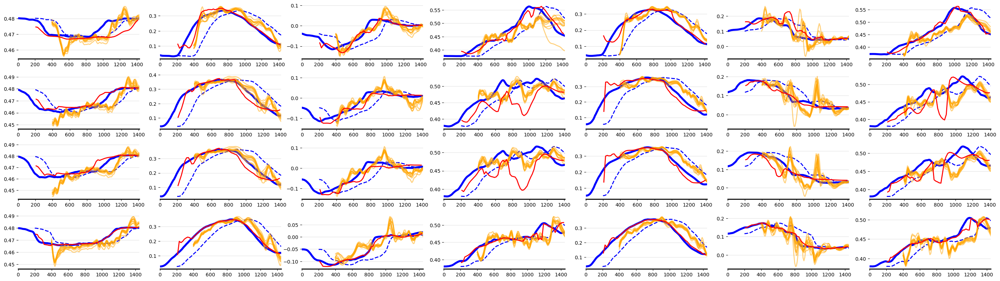

In [326]:
plot_prediction(task, all_preds_promp[task], all_preds_lstm[task])

## Comparisons of errors

6


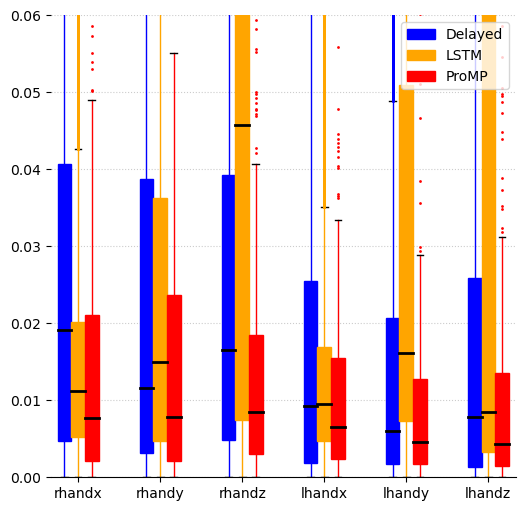

In [327]:
fig = plt.figure(figsize=(6,6))
ax = fig.add_subplot(1,1, 1)

# delayed
delayed = []
for i in range(len(dofs)):
    delayed += [[j for t in rms_delayed.keys() for j in rms_delayed[t][i]]]
# promp
promp = []
for i in range(len(dofs)):
    promp += [[j for t in rms_promp.keys() for j in rms_promp[t][i]]]
# lstm
lstm_errors_plot = [lstm_errors[k] for k in range(0, len(lstm_errors.keys()))]

ind = np.arange(len(promp[1:])) # x
print(len(promp[1:]))
colors = ['blue', 'orange', 'red', ]

ax.grid(color='#cccccc',linestyle='dotted', axis='y')
bp1 = ax.boxplot(delayed[1:], positions=ind*3-0.5, patch_artist=True, flierprops={'marker': 'o', 'markersize': 2, 'markeredgecolor':'none', 'markerfacecolor': colors[0]})
bp2 = ax.boxplot(lstm_errors_plot[1:], positions=ind*3, patch_artist=True,flierprops={'marker': 'o', 'markersize': 2, 'markeredgecolor':'none', 'markerfacecolor': colors[1]})
bp3 = ax.boxplot(promp[1:], positions=ind*3 + 0.5, patch_artist=True,flierprops={'marker': 'o', 'markersize': 2, 'markeredgecolor':'none', 'markerfacecolor': colors[2]})


for c, bplot in zip(colors, (bp1, bp2, bp3)):
    for w in bplot['whiskers']:
        w.set_color(c)
    for patch in bplot['boxes']:
        patch.set_facecolor(c)
        patch.set_color(c)
    for median in bplot['medians']:
        median.set(color ='black',
                    linewidth = 2)
        

ax.set_ylim([0, 0.06])
ax.set_xticks(ind*3)
ax.set_xticklabels([dofs[i+1] for i in ind])
ax.legend([bp1["boxes"][0], bp2["boxes"][0], bp3["boxes"][0]], ['Delayed', 'LSTM', 'ProMP'], loc='upper right')
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.spines['left'].set_visible(False)

fig.savefig(f"pred_errors_{horizon}.pdf")


In [3]:
import scipy.stats
for i in range(0, 6):
    _, p = scipy.stats.mannwhitneyu(lstm_errors_plot[i], promp[i])
    print(dofs[i], "LSTM vs ProMP: p-value:", p)
for i in range(0, 6):
    _, p = scipy.stats.mannwhitneyu(lstm_errors_plot[i], delayed[i])
    print(dofs[i], "LSTM vs delayed: p-value:", p)
for i in range(0, 6):
    _, p = scipy.stats.mannwhitneyu(promp[i], delayed[i])
    print(dofs[i], "Promp vs delayed: p-value:", p)


NameError: name 'lstm_errors_plot' is not defined